In [1]:
# Importing libraries
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go 
import plotly.io as pio
pio.templates.default = 'plotly_white'

In [2]:
# opening retail dataset
df = pd.read_csv('new_retail_data.csv')

In [3]:
df.shape

(302010, 30)

In [4]:
# to see all the columns in a dataset
pd.set_option('display.max_columns', None)

In [5]:
# first 5 rows
df.head()

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
0,8691788.0,37249.0,Michelle Harrington,Ebony39@gmail.com,1.414787e+09,3959 Amanda Burgs,Dortmund,Berlin,77985.0,Germany,21.0,Male,Low,Regular,9/18/2023,2023.0,September,22:03:55,3.0,108.028757,324.086270,Clothing,Nike,Shorts,Excellent,Same-Day,Debit Card,Shipped,5.0,Cycling shorts
1,2174773.0,69749.0,Kelsey Hill,Mark36@gmail.com,6.852900e+09,82072 Dawn Centers,Nottingham,England,99071.0,UK,19.0,Female,Low,Premium,12/31/2023,2023.0,December,8:42:04,2.0,403.353907,806.707815,Electronics,Samsung,Tablet,Excellent,Standard,Credit Card,Processing,4.0,Lenovo Tab
2,6679610.0,30192.0,Scott Jensen,Shane85@gmail.com,8.362160e+09,4133 Young Canyon,Geelong,New South Wales,75929.0,Australia,48.0,Male,Low,Regular,4/26/2023,2023.0,April,4:06:29,3.0,354.477600,1063.432799,Books,Penguin Books,Children's,Average,Same-Day,Credit Card,Processing,2.0,Sports equipment
3,7232460.0,62101.0,Joseph Miller,Mary34@gmail.com,2.776752e+09,8148 Thomas Creek Suite 100,Edmonton,Ontario,88420.0,Canada,56.0,Male,High,Premium,5/8/2023,2023.0,May,14:55:17,7.0,352.407717,2466.854021,Home Decor,Home Depot,Tools,Excellent,Standard,PayPal,Processing,4.0,Utility knife
4,4983775.0,27901.0,Debra Coleman,Charles30@gmail.com,9.098268e+09,5813 Lori Ports Suite 269,Bristol,England,48704.0,UK,22.0,Male,Low,Premium,1/10/2024,2024.0,January,16:54:07,2.0,124.276524,248.553049,Grocery,Nestle,Chocolate,Bad,Standard,Cash,Shipped,1.0,Chocolate cookies


In [6]:
# last 5 rows
df.tail()

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
302005,4246475.0,12104.0,Meagan Ellis,Courtney60@gmail.com,7.466354e+09,389 Todd Path Apt. 159,Townsville,New South Wales,4567.0,Australia,31.0,Male,Medium,Regular,1/20/2024,2024.0,January,23:40:29,5.0,194.792597,973.962984,Books,Penguin Books,Fiction,Bad,Same-Day,Cash,Processing,1.0,Historical fiction
302006,1197603.0,69772.0,Mathew Beck,Jennifer71@gmail.com,5.754305e+09,52809 Mark Forges,Hanover,Berlin,16852.0,Germany,35.0,Female,Low,New,12/28/2023,2023.0,December,2:55:45,1.0,285.137301,285.137301,Electronics,Apple,Laptop,Excellent,Same-Day,Cash,Processing,5.0,LG Gram
302007,7743242.0,28449.0,Daniel Lee,Christopher100@gmail.com,9.382530e+09,407 Aaron Crossing Suite 495,Brighton,England,88038.0,UK,41.0,Male,Low,Premium,2/27/2024,2024.0,February,2:43:49,3.0,60.701761,182.105285,Clothing,Adidas,Jacket,Average,Express,Cash,Shipped,2.0,Parka
302008,9301950.0,45477.0,Patrick Wilson,Rebecca65@gmail.com,9.373222e+09,3204 Baird Port,Halifax,Ontario,67608.0,Canada,41.0,Male,Medium,New,9/3/2023,2023.0,September,11:20:31,1.0,120.834784,120.834784,Home Decor,IKEA,Furniture,Good,Standard,Cash,Shipped,4.0,TV stand
302009,2882826.0,53626.0,Dustin Merritt,William14@gmail.com,9.518927e+09,143 Amanda Crescent,Tucson,West Virginia,25242.0,USA,28.0,Female,Low,Premium,1/8/2024,2024.0,January,11:44:36,7.0,340.319059,2382.233417,Home Decor,Home Depot,Decorations,Average,Same-Day,Cash,Shipped,2.0,Clocks


## Data Cleaning 

In [7]:
# checking a dataset's values and datatypes before starting to clean
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302010 entries, 0 to 302009
Data columns (total 30 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Transaction_ID    301677 non-null  float64
 1   Customer_ID       301702 non-null  float64
 2   Name              301628 non-null  object 
 3   Email             301663 non-null  object 
 4   Phone             301648 non-null  float64
 5   Address           301695 non-null  object 
 6   City              301762 non-null  object 
 7   State             301729 non-null  object 
 8   Zipcode           301670 non-null  float64
 9   Country           301739 non-null  object 
 10  Age               301837 non-null  float64
 11  Gender            301693 non-null  object 
 12  Income            301720 non-null  object 
 13  Customer_Segment  301795 non-null  object 
 14  Date              301651 non-null  object 
 15  Year              301660 non-null  float64
 16  Month             30

In [8]:
# checking null values
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                 173
Gender              317
Income              290
Customer_Segment    215
Date                359
Year                350
Month               273
Time                350
Total_Purchases     361
Amount              357
Total_Amount        350
Product_Category    283
Product_Brand       281
Product_Type          0
Feedback            184
Shipping_Method     337
Payment_Method      297
Order_Status        235
Ratings             184
products              0
dtype: int64

In [9]:
# checking duplicated values
df.duplicated().sum()

4

In [10]:
df[df.duplicated].head()

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
299759,4476510.0,20103.0,Christine Kim,James11@gmail.com,2.383778e+09,8176 Randy Squares Apt. 772,Kitchener,Ontario,7099.0,Canada,54.0,Female,Low,Regular,12/10/2023,2023.0,December,1:09:09,7.0,134.374182,940.619277,Clothing,Adidas,T-shirt,Bad,Express,Credit Card,Processing,1.0,Off-the-shoulder tee
301094,5340129.0,29920.0,Collin Davis,Courtney47@gmail.com,4.087767e+09,371 Cynthia Drives Suite 699,Wollongong,New South Wales,47758.0,Australia,54.0,Male,Low,New,12/19/2023,2023.0,December,11:33:48,6.0,NaN,2201.568075,Grocery,Pepsi,Soft Drink,Excellent,Express,Cash,Delivered,4.0,Fruit punch
301362,4942326.0,25416.0,Pamela Martin,Christine83@gmail.com,6.657934e+09,9851 Myers Tunnel,Leicester,England,57655.0,UK,63.0,Male,Low,Regular,5/5/2023,2023.0,May,4:17:21,8.0,191.906886,1535.255087,Clothing,Adidas,Jacket,Average,Same-Day,Cash,Pending,2.0,Varsity jacket
301486,3200766.0,49598.0,Mikayla Mueller,Kenneth43@gmail.com,6.980439e+09,716 Joshua Rapids Apt. 790,Bremen,Berlin,64747.0,Germany,59.0,Male,Low,New,11/23/2023,2023.0,November,15:35:49,9.0,272.327418,2450.946762,Grocery,Pepsi,Soft Drink,Bad,Standard,Cash,Pending,1.0,Iced tea


In [11]:
df.describe()

,Transaction_ID,Customer_ID,Phone,Zipcode,Age,Year,Total_Purchases,Amount,Total_Amount,Ratings
count,3.016770e+05,301702.000000,3.016480e+05,301670.000000,301837.000000,301660.000000,301649.000000,301653.000000,301660.000000,301826.000000
mean,5.495823e+06,55006.553934,5.501464e+09,50298.951019,35.481326,2023.165113,5.359729,255.163659,1367.651156,3.162670
std,2.595565e+06,26005.675200,2.596017e+09,28972.807134,15.021933,0.371283,2.868575,141.389640,1128.998515,1.320827
min,1.000007e+06,10000.000000,1.000049e+09,501.000000,18.000000,2023.000000,1.000000,10.000219,10.003750,1.000000
25%,3.247930e+06,32469.250000,3.255061e+09,25425.000000,22.000000,2023.000000,3.000000,132.890764,438.724278,2.000000
50%,5.499657e+06,55012.000000,5.505812e+09,50602.500000,32.000000,2023.000000,5.000000,255.470969,1041.117547,3.000000
75%,7.739509e+06,77511.000000,7.749860e+09,75252.000000,46.000000,2023.000000,8.000000,377.672606,2029.999853,4.000000
max,9.999995e+06,99999.000000,9.999996e+09,99949.000000,70.000000,2024.000000,10.000000,499.997911,4999.625796,5.000000


In [12]:
# finding mean of zipcode to fill na
mean_zipcode = df['Zipcode'].mean()

# zipcode have NaN we can't convert it into "int" so that we fill with mean value
df['Zipcode'].fillna(mean_zipcode, inplace=True)

# Convert 'Zipcode' to integres
df['Zipcode'] = df['Zipcode'].astype(np.int64)

In [13]:
# count values of zip codes with 4 digits
zip_4_digits_count = df['Zipcode'].astype(str).str.len().eq(4).sum()

# count values of zip  codes with 5 digits
zip_5_digits_count = df['Zipcode'].astype(str).str.len().eq(5).sum()
total_zipcodes = len(df)

zip_4_digits_percentage = (zip_4_digits_count / total_zipcodes) * 100
zip_5_digits_percentage = (zip_5_digits_count / total_zipcodes) * 100

In [14]:
print("Number of 4 digit zip codes:", zip_4_digits_count)
print("Number of 5 digit zip codes:", zip_5_digits_count)
print("Percentage of 4 digit zip codes:", zip_4_digits_percentage)
print("Percentage of 5 digit zip codes:", zip_5_digits_percentage)

Number of 4 digit zip codes: 30347
Number of 5 digit zip codes: 270487
Percentage of 4 digit zip codes: 10.048342770106949
Percentage of 5 digit zip codes: 89.56226615012748


In [15]:
import random

df['Zipcode'] = df['Zipcode'].astype(str)

 # trim any whitespaces in zipcode becuase some of them are str in early format
df['Zipcode'] = df['Zipcode'].str.strip()

# finding zipcodes with 4 digits in a  
zip_4_digits = df['Zipcode'].str.len().eq(4)

# adding a random int with 4 digit zipcode to convert it into 5digit zipcode
if zip_4_digits.any():
    df.loc[zip_4_digits, 'Zipcode'] = df.loc[zip_4_digits, 'Zipcode'].apply(lambda x: x + str(random.randint(0, 9)))

In [16]:
# Fill NaN values with the mean of the columns and convert into int
mean_zipcode = df['Zipcode'].astype(float).mean()
df['Zipcode'] = df['Zipcode'].fillna(mean_zipcode)
df['Zipcode'] = df['Zipcode'].astype(int)

In [17]:
# verifying zipcode values
df.head(2)

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
0,8691788.0,37249.0,Michelle Harrington,Ebony39@gmail.com,1.414787e+09,3959 Amanda Burgs,Dortmund,Berlin,77985,Germany,21.0,Male,Low,Regular,9/18/2023,2023.0,September,22:03:55,3.0,108.028757,324.086270,Clothing,Nike,Shorts,Excellent,Same-Day,Debit Card,Shipped,5.0,Cycling shorts
1,2174773.0,69749.0,Kelsey Hill,Mark36@gmail.com,6.852900e+09,82072 Dawn Centers,Nottingham,England,99071,UK,19.0,Female,Low,Premium,12/31/2023,2023.0,December,8:42:04,2.0,403.353907,806.707815,Electronics,Samsung,Tablet,Excellent,Standard,Credit Card,Processing,4.0,Lenovo Tab


In [18]:
# Fill NaN values with the mean of the columns and convert into int
df['Transaction_ID'].fillna(df['Transaction_ID'].astype(float).mean(), inplace=True)
df['Transaction_ID'] = df['Transaction_ID'].astype('int64')

df['Customer_ID'].fillna(df['Customer_ID'].astype(float).mean(), inplace=True)
df['Customer_ID'] = df['Customer_ID'].astype('int64')


df['Phone'].fillna(df['Phone'].astype(float).mean(), inplace=True)
df['Phone'] = df['Phone'].astype('int64')

df['Age'].fillna(df['Age'].astype(float).mean(), inplace=True)
df['Age'] = df['Age'].astype('int64')

df['Total_Purchases'].fillna(df['Total_Purchases'].astype(float).mean(), inplace=True)
df['Total_Purchases'] = df['Total_Purchases'].astype('int64')


df['Year'].fillna(df['Year'].astype(float).mean(), inplace=True)
df['Year'] = df['Year'].astype('int64')


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302010 entries, 0 to 302009
Data columns (total 30 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Transaction_ID    302010 non-null  int64  
 1   Customer_ID       302010 non-null  int64  
 2   Name              301628 non-null  object 
 3   Email             301663 non-null  object 
 4   Phone             302010 non-null  int64  
 5   Address           301695 non-null  object 
 6   City              301762 non-null  object 
 7   State             301729 non-null  object 
 8   Zipcode           302010 non-null  int32  
 9   Country           301739 non-null  object 
 10  Age               302010 non-null  int64  
 11  Gender            301693 non-null  object 
 12  Income            301720 non-null  object 
 13  Customer_Segment  301795 non-null  object 
 14  Date              301651 non-null  object 
 15  Year              302010 non-null  int64  
 16  Month             30

In [20]:
# remove rows with negative toatal purchases amount and total amount values
df = df[(df['Total_Purchases'] >= 0) & (df['Amount'] >= 0) & (df['Total_Amount'] >= 0)]

In [21]:
 # converting date, year, time into datetime datatype format

df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y', errors='coerce').dt.strftime('%Y-%m-%d')
df['Time'] = pd.to_datetime(df['Time'], format='%H:%M:%S', errors='coerce').dt.strftime('%H:%M:%S')


In [22]:
# fill na values using interpolate
df['Total_Purchases'] = df['Total_Purchases'].interpolate(direction='both')
df['Amount'] = df['Amount'].interpolate(direction='both')                        

In [23]:
# verying total_amount column by multiplying total_purchase and amount
print('Total rows and columns')
print(df.shape)
print(len(df['Total_Amount'] == df['Total_Purchases'] * df['Amount']))

Total rows and columns
(301304, 30)
301304


In [24]:
# calulating null_percentage to see whether having more no of null values or less 
null_percentage = (df.isnull().sum() / df.shape[0]) * 100
null_percentage

Transaction_ID      0.000000
Customer_ID         0.000000
Name                0.126450
Email               0.115166
Phone               0.000000
Address             0.104546
City                0.082309
State               0.092598
Zipcode             0.000000
Country             0.089610
Age                 0.000000
Gender              0.104877
Income              0.096248
Customer_Segment    0.071357
Date                0.118817
Year                0.000000
Month               0.090274
Time                0.115830
Total_Purchases     0.000000
Amount              0.000000
Total_Amount        0.000000
Product_Category    0.093925
Product_Brand       0.093261
Product_Type        0.000000
Feedback            0.061068
Shipping_Method     0.110851
Payment_Method      0.098572
Order_Status        0.077994
Ratings             0.061068
products            0.000000
dtype: float64

In [25]:
# fill the null values through the mean and mode forthe numerical and categorical columns
#numerical columns
numerical_columns = df.select_dtypes(include=['float64', 'int32']).columns
df[numerical_columns] = df[numerical_columns].fillna(df[numerical_columns].mean())

# categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
df[categorical_columns] = df[categorical_columns].fillna(df[categorical_columns].mode().iloc[0])

In [26]:
df.isnull().sum()

Transaction_ID      0
Customer_ID         0
Name                0
Email               0
Phone               0
Address             0
City                0
State               0
Zipcode             0
Country             0
Age                 0
Gender              0
Income              0
Customer_Segment    0
Date                0
Year                0
Month               0
Time                0
Total_Purchases     0
Amount              0
Total_Amount        0
Product_Category    0
Product_Brand       0
Product_Type        0
Feedback            0
Shipping_Method     0
Payment_Method      0
Order_Status        0
Ratings             0
products            0
dtype: int64

In [27]:
df.shape

(301304, 30)

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 301304 entries, 0 to 302009
Data columns (total 30 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Transaction_ID    301304 non-null  int64  
 1   Customer_ID       301304 non-null  int64  
 2   Name              301304 non-null  object 
 3   Email             301304 non-null  object 
 4   Phone             301304 non-null  int64  
 5   Address           301304 non-null  object 
 6   City              301304 non-null  object 
 7   State             301304 non-null  object 
 8   Zipcode           301304 non-null  int32  
 9   Country           301304 non-null  object 
 10  Age               301304 non-null  int64  
 11  Gender            301304 non-null  object 
 12  Income            301304 non-null  object 
 13  Customer_Segment  301304 non-null  object 
 14  Date              301304 non-null  object 
 15  Year              301304 non-null  int64  
 16  Month             301304 

In [29]:
df.duplicated().sum()

2

In [30]:
df.describe()

,Transaction_ID,Customer_ID,Phone,Zipcode,Age,Year,Total_Purchases,Amount,Total_Amount,Ratings
count,3.013040e+05,301304.000000,3.013040e+05,301304.000000,301304.000000,301304.000000,301304.000000,301304.000000,301304.000000,301304.000000
mean,5.495707e+06,55005.797331,5.501396e+09,55033.654173,35.480083,2023.164930,5.359541,255.156504,1367.750237,3.162706
std,2.594075e+06,25993.484904,2.594447e+09,25942.423913,15.018428,0.371118,2.866895,141.392091,1128.997561,1.320448
min,1.000007e+06,10000.000000,1.000049e+09,501.000000,18.000000,2023.000000,1.000000,10.000219,10.003750,1.000000
25%,3.250671e+06,32487.000000,3.257246e+09,32590.000000,22.000000,2023.000000,3.000000,132.869731,438.801166,2.000000
50%,5.495822e+06,55006.000000,5.501464e+09,55075.000000,32.000000,2023.000000,5.000000,255.455298,1041.202023,3.000000
75%,7.737070e+06,77489.000000,7.747494e+09,77494.000000,46.000000,2023.000000,8.000000,377.668757,2030.036681,4.000000
max,9.999995e+06,99999.000000,9.999996e+09,99996.000000,70.000000,2024.000000,10.000000,499.997911,4999.625796,5.000000


In [31]:
df.duplicated().sum()

2

In [32]:
df[df.duplicated()].head()

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
301362,4942326,25416,Pamela Martin,Christine83@gmail.com,6657933964,9851 Myers Tunnel,Leicester,England,57655,UK,63,Male,Low,Regular,2023-05-05,2023,May,04:17:21,8,191.906886,1535.255087,Clothing,Adidas,Jacket,Average,Same-Day,Cash,Pending,2.0,Varsity jacket
301486,3200766,49598,Mikayla Mueller,Kenneth43@gmail.com,6980439265,716 Joshua Rapids Apt. 790,Bremen,Berlin,64747,Germany,59,Male,Low,New,2023-11-23,2023,November,15:35:49,9,272.327418,2450.946762,Grocery,Pepsi,Soft Drink,Bad,Standard,Cash,Pending,1.0,Iced tea


In [33]:
# df shape before removing duplicates
print('Shape of df before removing duplicates', df.shape)

cols = df.columns
df.drop_duplicates(subset=cols, keep='first', inplace=True)
print('Shape of df after removing duplicates',df.shape)

Shape of df before removing duplicates (301304, 30)
Shape of df after removing duplicates (301302, 30)


In [34]:
df.duplicated().sum()

0

## Exploratory Data Analysis (EDA)

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 301302 entries, 0 to 302009
Data columns (total 30 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Transaction_ID    301302 non-null  int64  
 1   Customer_ID       301302 non-null  int64  
 2   Name              301302 non-null  object 
 3   Email             301302 non-null  object 
 4   Phone             301302 non-null  int64  
 5   Address           301302 non-null  object 
 6   City              301302 non-null  object 
 7   State             301302 non-null  object 
 8   Zipcode           301302 non-null  int32  
 9   Country           301302 non-null  object 
 10  Age               301302 non-null  int64  
 11  Gender            301302 non-null  object 
 12  Income            301302 non-null  object 
 13  Customer_Segment  301302 non-null  object 
 14  Date              301302 non-null  object 
 15  Year              301302 non-null  int64  
 16  Month             301302 

In [36]:
df['Date']

0         2023-09-18
1         2023-12-31
2         2023-04-26
3         2023-05-08
4         2024-01-10
             ...    
302005    2024-01-20
302006    2023-12-28
302007    2024-02-27
302008    2023-09-03
302009    2024-01-08
Name: Date, Length: 301302, dtype: object

In [37]:
df['Total_Amount'].sum()

412104631.0600601

In [38]:
# verifying amount, total purchase = total_amount
(df['Amount'] * df['Total_Purchases']).sum()

412076456.7475864

In [39]:
df['Age'].describe()

count    301302.000000
mean         35.479914
std          15.018333
min          18.000000
25%          22.000000
50%          32.000000
75%          46.000000
max          70.000000
Name: Age, dtype: float64

In [40]:
df['Age'].unique()

array([21, 19, 48, 56, 22, 58, 29, 46, 25, 64, 31, 53, 32, 43, 69, 49, 61,
       41, 38, 59, 20, 67, 50, 26, 66, 24, 54, 28, 34, 65, 40, 68, 36, 57,
       27, 35, 70, 37, 30, 39, 47, 18, 60, 33, 62, 42, 44, 51, 63, 55, 23,
       52, 45], dtype=int64)

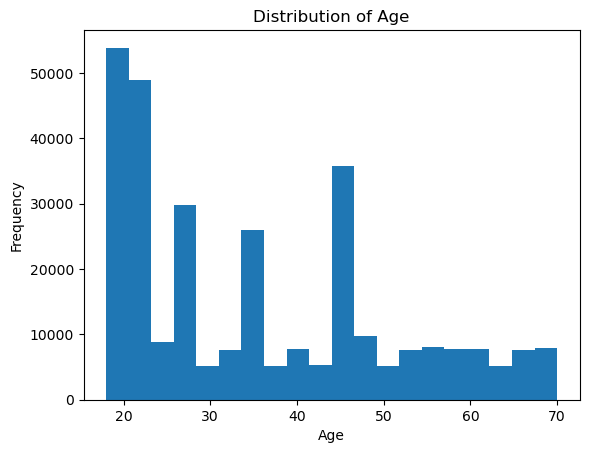

In [41]:
df['Age'].plot(kind='hist',  bins=20)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Distribution of Age')
plt.show()

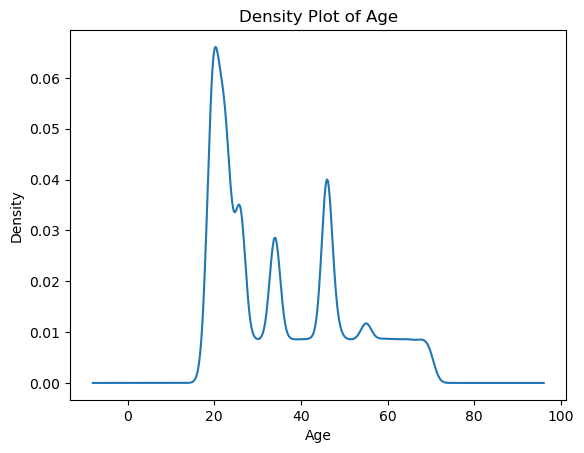

In [42]:
df['Age'].plot(kind='kde')
plt.xlabel('Age')
plt.title('Density Plot of Age')
plt.show()

In [43]:
df['Age'].skew()

0.6528874498647981

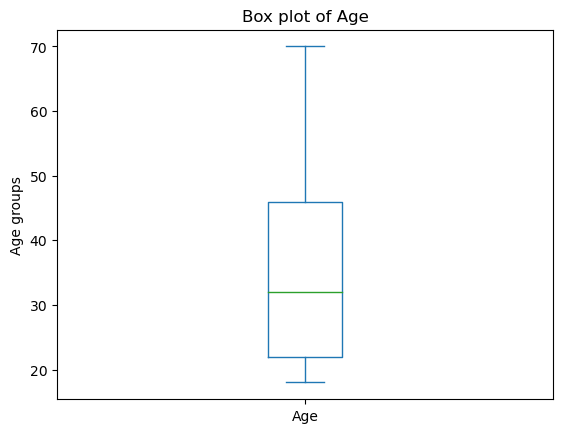

In [44]:
df['Age'].plot(kind='box')
plt.ylabel('Age groups')
plt.title('Box plot of Age')
plt.show()

In [45]:
df['Year'].describe()

count    301302.000000
mean       2023.164931
std           0.371119
min        2023.000000
25%        2023.000000
50%        2023.000000
75%        2023.000000
max        2024.000000
Name: Year, dtype: float64

In [46]:
df['Year'].unique()

array([2023, 2024], dtype=int64)

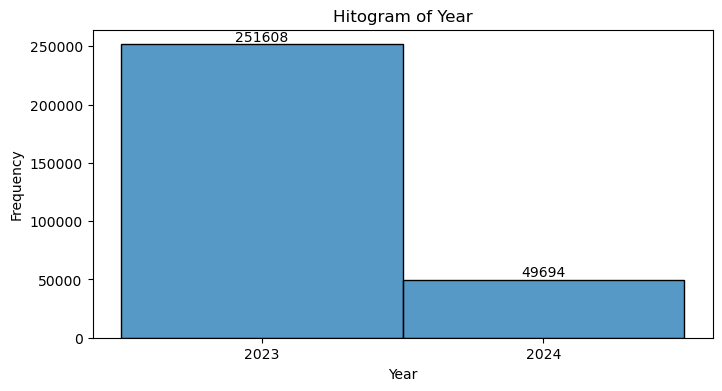

In [47]:
plt.figure(figsize=(8,4))
ax = sns.histplot(data=df, x='Year', bins=10, discrete=True)

plt.xticks(range(int(df['Year'].min()), int(df['Year'].max()) + 1))
for container in ax.containers:
    ax.bar_label(container, label_type='edge')
plt.title('Hitogram of Year')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.show()


In [48]:
df['Date'] = pd.to_datetime(df['Date'])
df_2023 = df[df['Date'].dt.year == 2023]
monthly_amount = df_2023.groupby(df_2023['Date'].dt.month)['Total_Amount'].sum()
monthly_amount = monthly_amount.reindex(range(1, 13), fill_value=0)
print(monthly_amount)

Date
1     0.000000e+00
2     0.000000e+00
3     3.517750e+07
4     3.397428e+07
5     3.444051e+07
6     3.370007e+07
7     3.480546e+07
8     3.512546e+07
9     3.384789e+07
10    3.453147e+07
11    3.414011e+07
12    3.462572e+07
Name: Total_Amount, dtype: float64


In [49]:
df['Date'] = pd.to_datetime(df['Date'])
df_2024 = df[df['Date'].dt.year == 2024]
monthly_amount = df_2024.groupby(df_2024['Date'].dt.month)['Total_Amount'].sum()
print(monthly_amount)

Date
1    3.467055e+07
2    3.306561e+07
Name: Total_Amount, dtype: float64


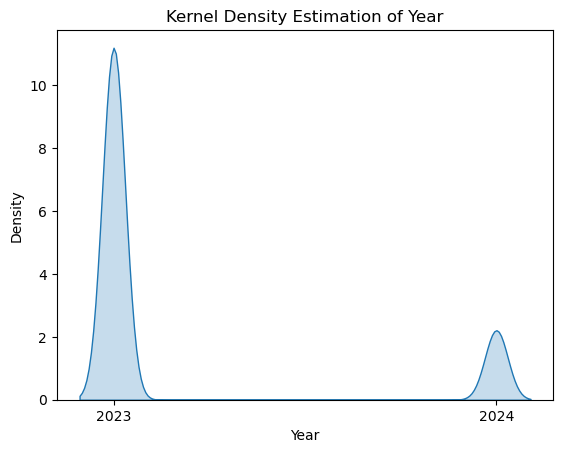

In [50]:
sns.kdeplot(data=df['Year'], fill=True)
plt.title('Kernel Density Estimation of Year')
plt.xlabel('Year')
plt.ylabel('Density')
plt.xticks(range(int(df['Year'].min()), int(df['Year'].max()) + 1))
           
plt.show()

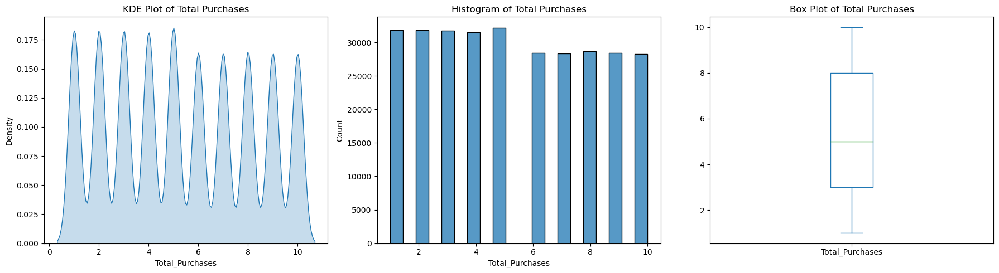

In [51]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))


sns.kdeplot(data=df, x='Total_Purchases', fill=True, ax=axes[0])
axes[0].set_title('KDE Plot of Total Purchases')

sns.histplot(data=df, x='Total_Purchases', bins=20, ax=axes[1])
axes[1].set_title('Histogram of Total Purchases')

df['Total_Purchases'].plot(kind='box')
axes[2].set_title('Box Plot of Total Purchases')

plt.tight_layout()
plt.show()

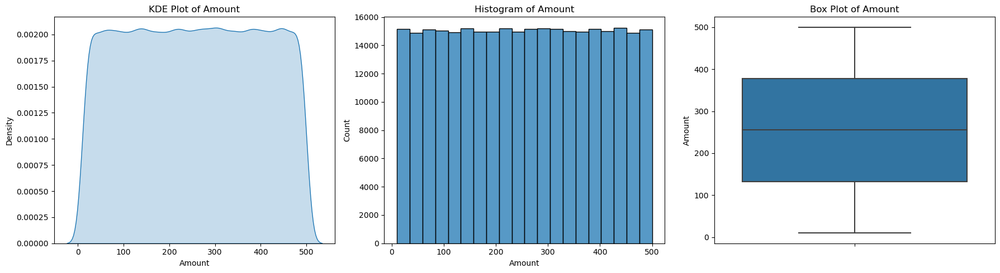

In [52]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))


sns.kdeplot(data=df, x='Amount', fill=True, ax=axes[0])
axes[0].set_title('KDE Plot of Amount')

sns.histplot(data=df, x='Amount', bins=20, ax=axes[1])
axes[1].set_title('Histogram of Amount')

sns.boxplot(data=df, y='Amount', ax=axes[2])
axes[2].set_title('Box Plot of Amount')

plt.tight_layout()
plt.show()

In [53]:
df['Amount'].skew()

-0.0021323148905416744

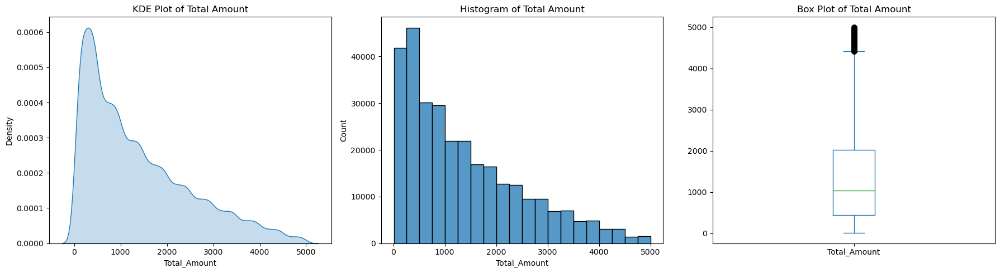

In [54]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))


sns.kdeplot(data=df, x='Total_Amount', fill=True, ax=axes[0])
axes[0].set_title('KDE Plot of Total Amount')

sns.histplot(data=df, x='Total_Amount', bins=20, ax=axes[1])
axes[1].set_title('Histogram of Total Amount')

df['Total_Amount'].plot(kind='box')
axes[2].set_title('Box Plot of Total Amount')

plt.tight_layout()
plt.show()

In [55]:
df['Total_Amount'].skew()

0.9727762908018702

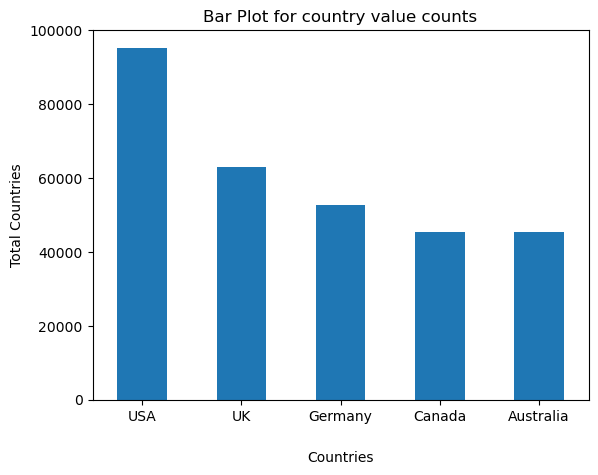

In [56]:
ax = df['Country'].value_counts().plot(kind='bar')

for containers in ax.containers:
    ax.bar_label(container, fmt='%.0f', label_type='edge')
plt.xlabel('Countries', labelpad=20)
plt.ylabel('Total Countries')
plt.title('Bar Plot for country value counts')
plt.xticks(rotation=360)
plt.show()


In [57]:
# import matplotlib.pyplot as plt

# # Your existing code
# fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# # Create a pie chart
# df['Country'].value_counts().plot(kind='pie', ax=axes[0], autopct='%1.1f%%')
# axes[0].set_title('Pie Chart of Countries')
# axes[0].set_ylabel("")

# # Create a frequency table (use plt.table)
# table_data = frequency_table.values
# table_columns = frequency_table.columns
# axes[1].axis('off')  # Hide axis for the table
# axes[1].table(cellText=table_data, colLabels=table_columns, loc='center')
# axes[1].set_title('Frequency Table of Countries')


# mode_value = df['Country'].mode().values[0]
# axes[2].text(0.5, 0.5, f'mode: {mode_value}', fontsize=10, ha='center')
# axes[2].axis('off')
# axes[2].set_title('Mode of Countries')


# unique_count = df['Country'].nunique()
# axes[3].text(0.5, 0.5, f'Unique Values: {unique_count}', fontsize=10, ha='center')
# axes[3].axis('off')
# axes[3].set_title('Unique values of Countries')


# plt.tight_layout()
# plt.show()


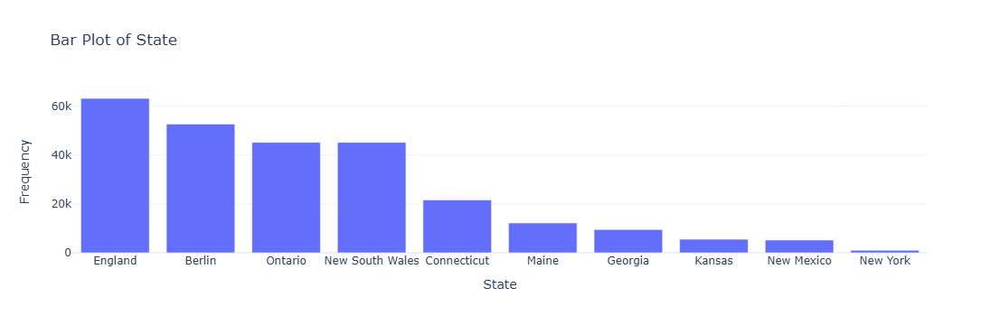

In [58]:
state_counts = df['State'].value_counts().reset_index().head(10)
state_counts.columns = ['State', 'Frequency']
fig = px.bar(state_counts, x='State', y='Frequency', title='Bar Plot of State')
fig.show()

In [59]:
df[['Amount']].describe()

,Amount
count,301302.000000
mean,255.156657
std,141.392510
min,10.000219
25%,132.869570
50%,255.455298
75%,377.669249
max,499.997911


In [60]:
df['Gender'].value_counts()

Gender
Male      187463
Female    113839
Name: count, dtype: int64

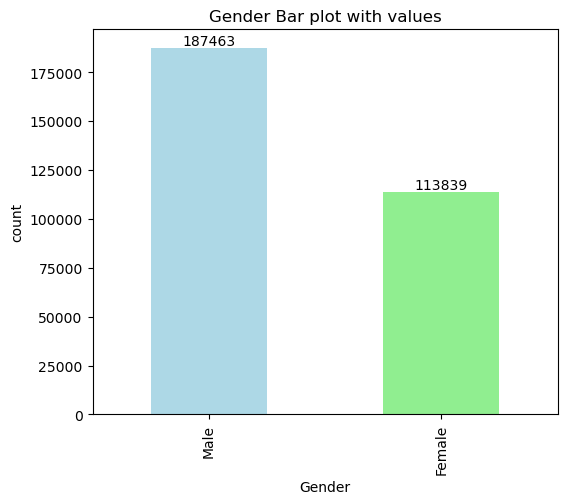

In [61]:
df['Gender'].value_counts().plot(kind='bar', color=('lightblue', 'lightgreen'), figsize=(6,5))
plt.title('Gender Bar plot with values')
plt.ylabel('count')
bars = plt.gca().patches
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), int(bar.get_height()), ha='center', va='bottom')


plt.show()

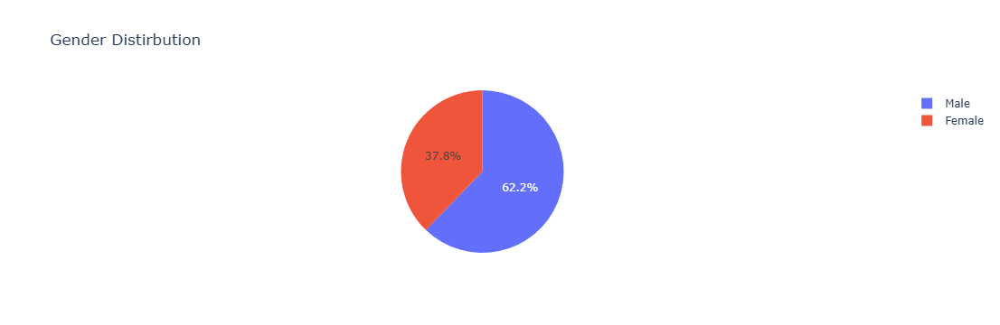

In [62]:
gender_counts = df['Gender'].value_counts()
fig = px.pie(names=gender_counts.index, values=gender_counts.values, title='Gender Distirbution')
fig.show()

In [63]:
df['Income'].describe()

count     301302
unique         3
top       Medium
freq      130217
Name: Income, dtype: object

In [64]:
df['Income'].value_counts()

Income
Medium    130217
Low        96013
High       75072
Name: count, dtype: int64

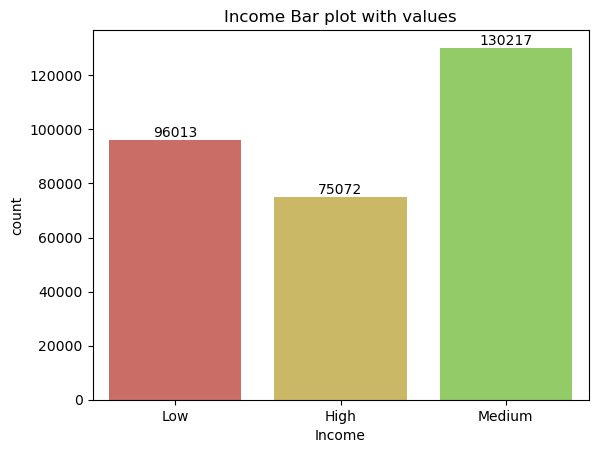

In [65]:
income = sns.countplot(x='Income', data=df, palette = sns.color_palette("hls", 8))
for bars in income.containers:
    income.bar_label(bars)

plt.title('Income Bar plot with values')
plt.show()

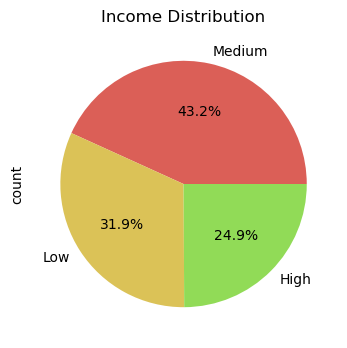

In [66]:
df['Income'].value_counts().plot(kind='pie', autopct='%1.1f%%', figsize=(4,4), colors=sns.color_palette("hls", 8))
plt.title("Income Distribution")
plt.show()

In [67]:
df['Customer_Segment'].describe()

count      301302
unique          3
top       Regular
freq       146097
Name: Customer_Segment, dtype: object

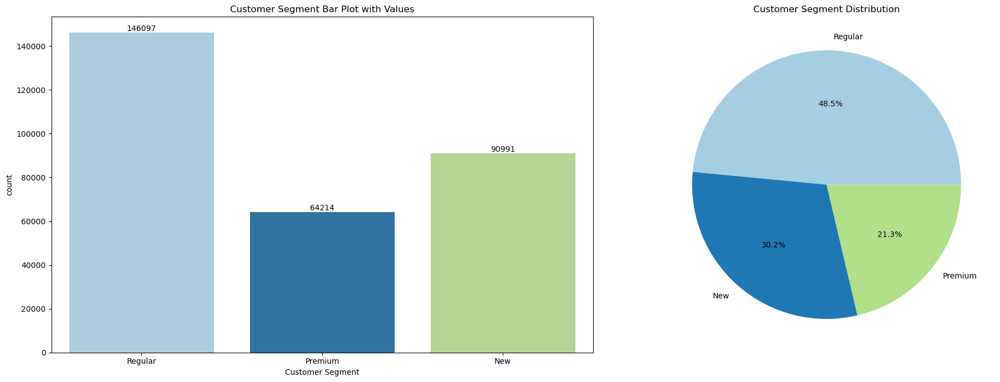

In [68]:
# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# Bar plot
customer_seg = sns.countplot(x='Customer_Segment', data=df, ax=axes[0], palette=sns.color_palette("Paired"))
for bars in customer_seg.containers:
    customer_seg.bar_label(bars)
axes[0].set_xlabel('Customer Segment')
axes[0].set_title('Customer Segment Bar Plot with Values')

# Pie chart
df['Customer_Segment'].value_counts().plot(kind='pie', autopct='%1.1f%%', ax=axes[1], colors=sns.color_palette("Paired"))
axes[1].set_title('Customer Segment Distribution')
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()


In [69]:
df[df['Year'] == 2023]['Month'].describe()

count     251608
unique        12
top        April
freq       37692
Name: Month, dtype: object

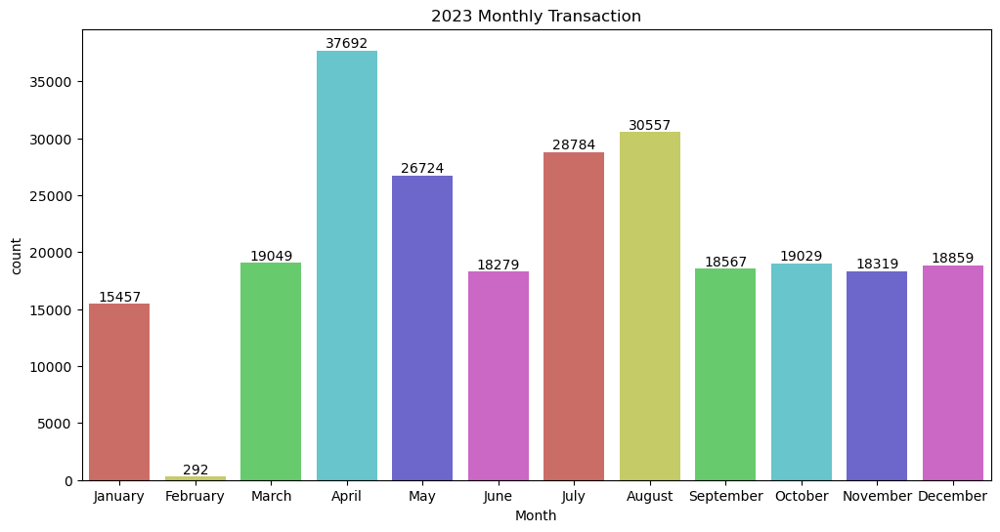

In [70]:
order=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

plt.figure(figsize=(12, 6))
month_transaction_2023 = sns.countplot(x='Month', data= df[df['Year'] == 2023],order=order, palette=sns.color_palette("hls"))
for bar in month_transaction_2023.containers:
    month_transaction_2023.bar_label(bar)

plt.title('2023 Monthly Transaction')
plt.show()

In [71]:
df['Product_Category'].describe()

count          301302
unique              5
top       Electronics
freq            71283
Name: Product_Category, dtype: object

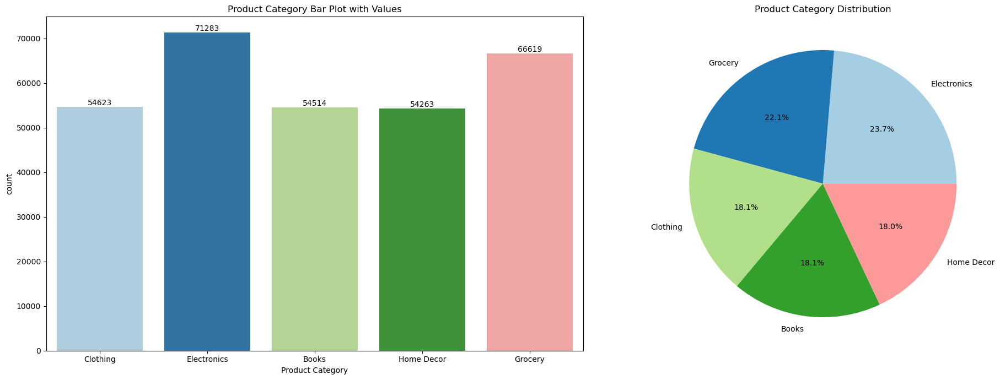

In [72]:
# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# Bar plot
prd_cat = sns.countplot(x='Product_Category', data=df, ax=axes[0], palette=sns.color_palette("Paired"))
for bars in prd_cat.containers:
    prd_cat.bar_label(bars)
axes[0].set_xlabel('Product Category')
axes[0].set_title('Product Category Bar Plot with Values')

# Pie chart
df['Product_Category'].value_counts().plot(kind='pie', autopct='%1.1f%%', ax=axes[1], colors=sns.color_palette("Paired"))
axes[1].set_title('Product Category Distribution')
axes[1].set_ylabel("")


plt.tight_layout()
plt.show()


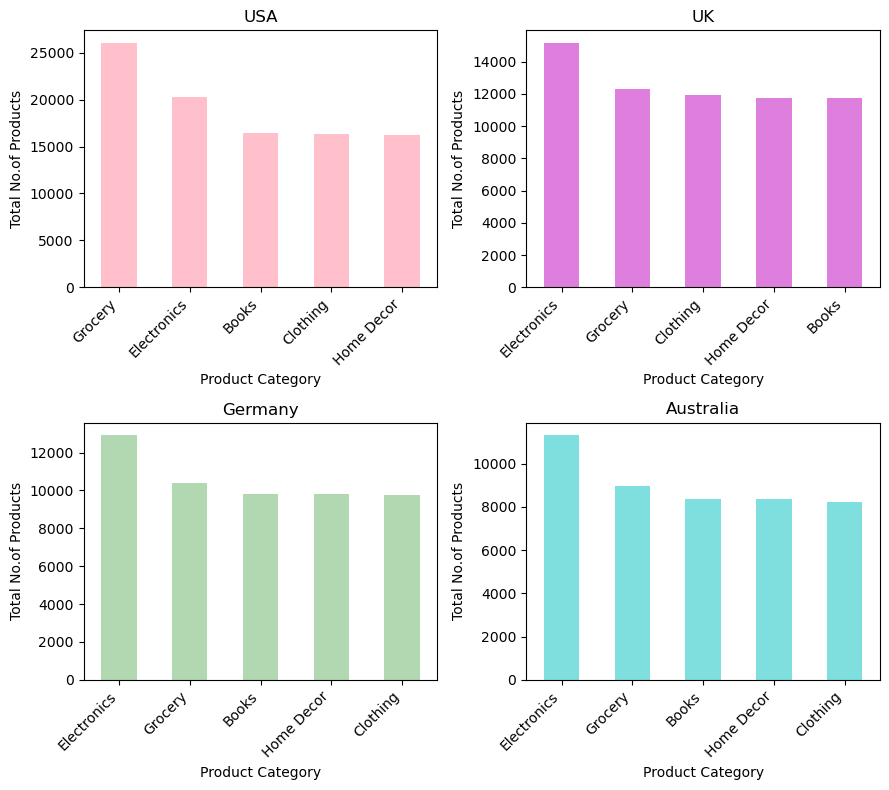

In [73]:

usa = df[df['Country'] == 'USA']['Product_Category'].value_counts()
uk = df[df['Country'] == 'UK']['Product_Category'].value_counts()
germany = df[df['Country'] == 'Germany']['Product_Category'].value_counts()
australia = df[df['Country'] == 'Australia']['Product_Category'].value_counts()

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9, 8))


usa.plot(kind="bar", x=usa.index, y= usa.values, ax=axes[0,0], color='pink')
axes[0, 0].set_title('USA')
axes[0, 0].set_ylabel('Total No.of Products')
axes[0, 0].set_xlabel('Product Category')



uk.plot(kind="bar", x=uk.index, y= uk.values, ax=axes[0,1], color='m', alpha=0.5)
axes[0, 1].set_title('UK')
axes[0, 1].set_ylabel('Total No.of Products')
axes[0, 1].set_xlabel('Product Category')


germany.plot(kind="bar", x=germany.index, y= germany.values, ax=axes[1,0], color='g', alpha=0.3)
axes[1, 0].set_title('Germany')
axes[1, 0].set_ylabel('Total No.of Products')
axes[1, 0].set_xlabel('Product Category')


australia.plot(kind="bar", x=australia.index, y= australia.values, ax=axes[1,1], color='c', alpha=0.5)
axes[1, 1].set_title('Australia')
axes[1, 1].set_ylabel('Total No.of Products')
axes[1, 1].set_xlabel('Product Category')


for ax in axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.tight_layout()  # Adjust subplot spacing

In [74]:
df['Product_Brand'].describe()

count     301302
unique        18
top        Pepsi
freq       30497
Name: Product_Brand, dtype: object

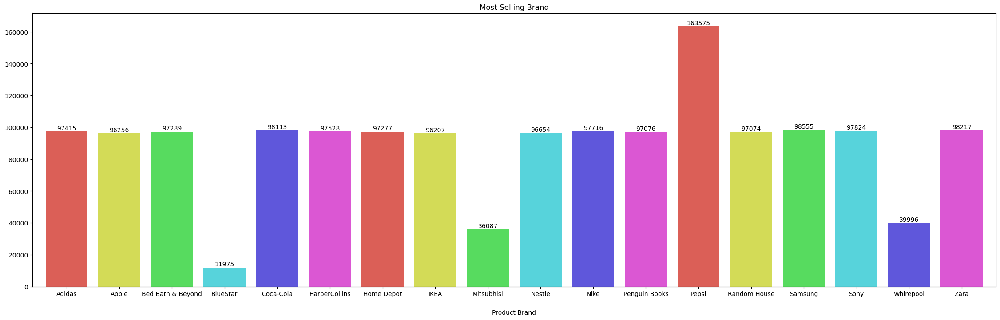

In [75]:
plt.figure(figsize=(28,8))


df.groupby('Product_Brand')['Total_Purchases'].sum().plot(kind='bar', color=sns.color_palette('hls'), width=0.8)
bars = plt.gca().patches
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), int(bar.get_height()), ha='center', va='bottom')
    plt.title('Most Selling Brand')

plt.xlabel('Product Brand', labelpad=20)
plt.xticks(rotation=360)
plt.show()

In [76]:
print('Revenue generated by brands')
df.groupby('Product_Brand')['Total_Amount'].sum().sort_values(ascending=False)


Revenue generated by brands


Product_Brand
Pepsi                4.169755e+07
Samsung              2.531636e+07
Sony                 2.505848e+07
Coca-Cola            2.498068e+07
Nike                 2.497866e+07
Bed Bath & Beyond    2.496093e+07
Zara                 2.495991e+07
HarperCollins        2.490074e+07
Penguin Books        2.483278e+07
Adidas               2.480900e+07
Random House         2.478029e+07
Home Depot           2.476883e+07
Nestle               2.467888e+07
Apple                2.459611e+07
IKEA                 2.449383e+07
Whirepool            1.006597e+07
Mitsubhisi           9.165586e+06
BlueStar             3.060049e+06
Name: Total_Amount, dtype: float64

In [77]:
# Which brand brings more revenue

df['Total_Amount'] = df['Total_Amount'].astype('int64')
brand_revenue = df.groupby('Product_Brand')['Total_Amount'].sum()
print('Brand Which brings more revenue')
print(f'{brand_revenue.idxmax()}: {brand_revenue.max()}')


Brand Which brings more revenue
Pepsi: 41682262


In [78]:
# pepsi products
print('Top 10 Revenue generating products from brand Pepsi')
pepsi = df[df['Product_Brand'] == 'Pepsi']
pepsi_products = pepsi.groupby('products')['Total_Amount'].sum()

print(pepsi_products.sort_values(ascending=False).head(10))

Top 10 Revenue generating products from brand Pepsi
products
Bottled water      2592595
Distilled water    2576475
Artesian water     2545454
Sparkling water    2525559
Flavored water     2519252
Spring water       2504827
Coconut water      2470517
Alkaline water     2461796
Mineral water      2448039
Purified water     2398636
Name: Total_Amount, dtype: int64


In [79]:
df['Feedback'].describe()

count        301302
unique            4
top       Excellent
freq         100710
Name: Feedback, dtype: object

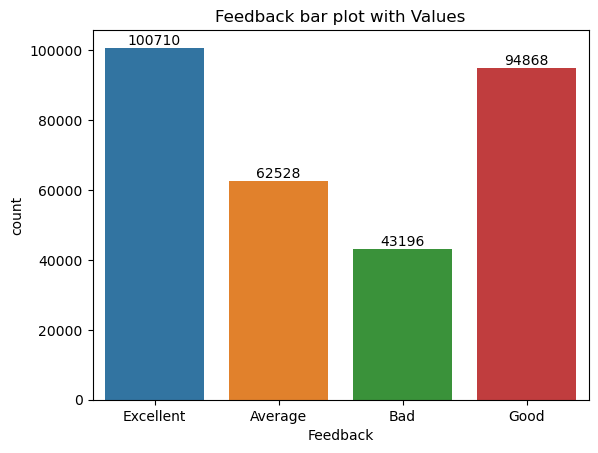

In [80]:
feedback = sns.countplot(x='Feedback', data=df)

for bar in feedback.containers:
    feedback.bar_label(bar)

plt.title('Feedback bar plot with Values')
plt.show()

In [81]:
df['Shipping_Method'].describe()

count       301302
unique           3
top       Same-Day
freq        104211
Name: Shipping_Method, dtype: object

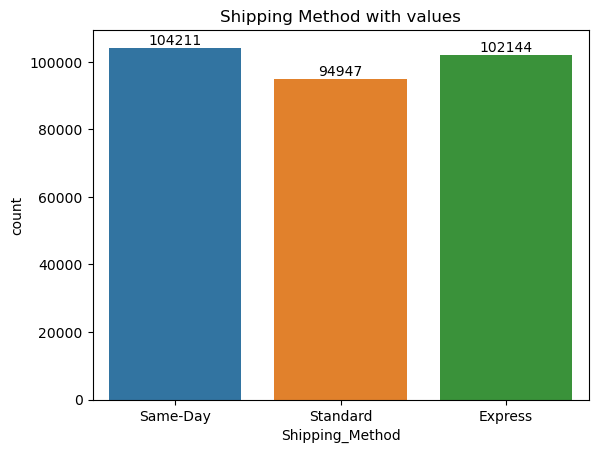

In [82]:
shipping_method = sns.countplot(x='Shipping_Method', data=df)
for bar in shipping_method.containers:
    shipping_method.bar_label(bar)

plt.title('Shipping Method with values')
plt.show()

In [83]:
df['Payment_Method'].describe()

count          301302
unique              4
top       Credit Card
freq            90186
Name: Payment_Method, dtype: object

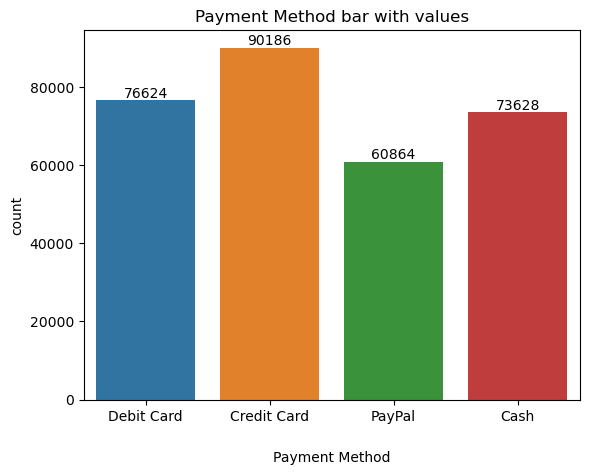

In [84]:
payment_method = sns.countplot(x='Payment_Method', data=df)

for bar in payment_method.containers:
    payment_method.bar_label(bar)

plt.title('Payment Method bar with values')
plt.xlabel('Payment Method', labelpad=20)
plt.show()

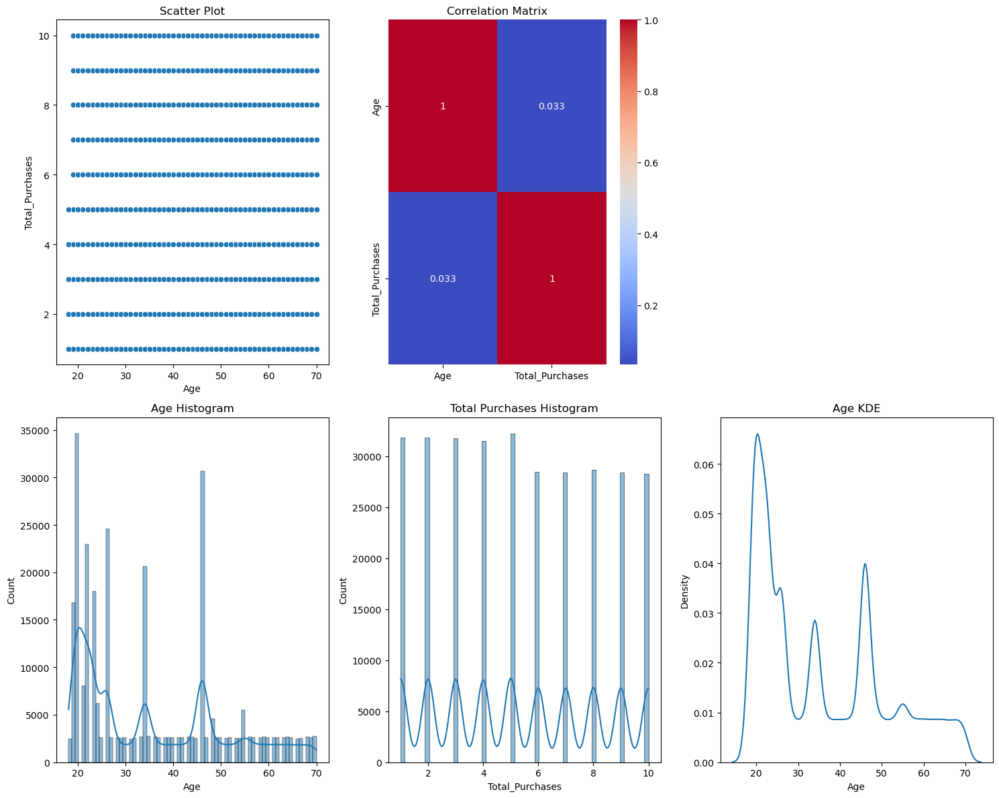

In [85]:
fig, axes = plt.subplots(2, 3, figsize=(15,12))

sns.scatterplot(x='Age', y='Total_Purchases', data=df, ax=axes[0, 0])
axes[0,0].set_title('Scatter Plot')

corr = df[['Age', 'Total_Purchases']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', ax=axes[0,1])
axes[0,1].set_title('Correlation Matrix')

sns.histplot(x='Age', data=df,kde=True, ax=axes[1, 0])
axes[1, 0].set_title('Age Histogram')

sns.histplot(x='Total_Purchases', data=df,kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Total Purchases Histogram')

sns.kdeplot(x='Age', data=df, ax=axes[1, 2])
axes[1, 2].set_title('Age KDE')
fig.delaxes(axes[0, 2])
plt.tight_layout()
plt.show()

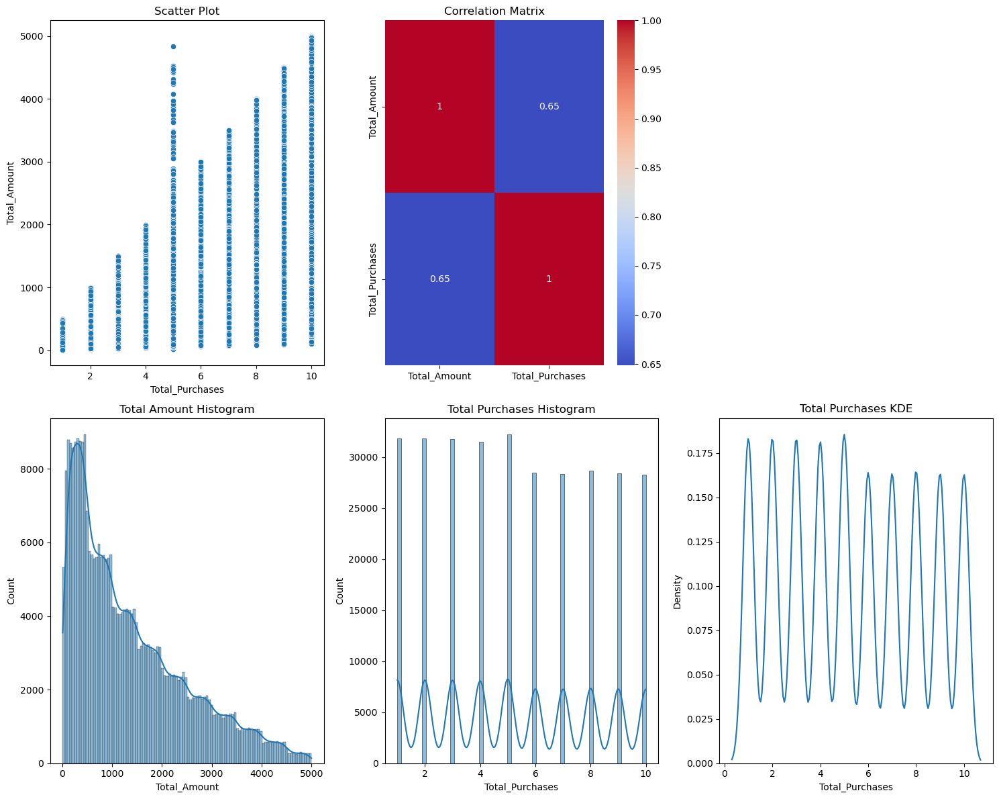

In [86]:
fig, axes = plt.subplots(2, 3, figsize=(15,12))

sns.scatterplot(x='Total_Purchases', y='Total_Amount', data=df, ax=axes[0, 0])
axes[0,0].set_title('Scatter Plot')

corr = df[['Total_Amount', 'Total_Purchases']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', ax=axes[0,1])
axes[0,1].set_title('Correlation Matrix')

sns.histplot(x='Total_Amount', data=df,kde=True, ax=axes[1, 0])
axes[1, 0].set_title('Total Amount Histogram')

sns.histplot(x='Total_Purchases', data=df,kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Total Purchases Histogram')

sns.kdeplot(x='Total_Purchases', data=df, ax=axes[1, 2])
axes[1, 2].set_title('Total Purchases KDE')
fig.delaxes(axes[0, 2])
plt.tight_layout()
plt.show()

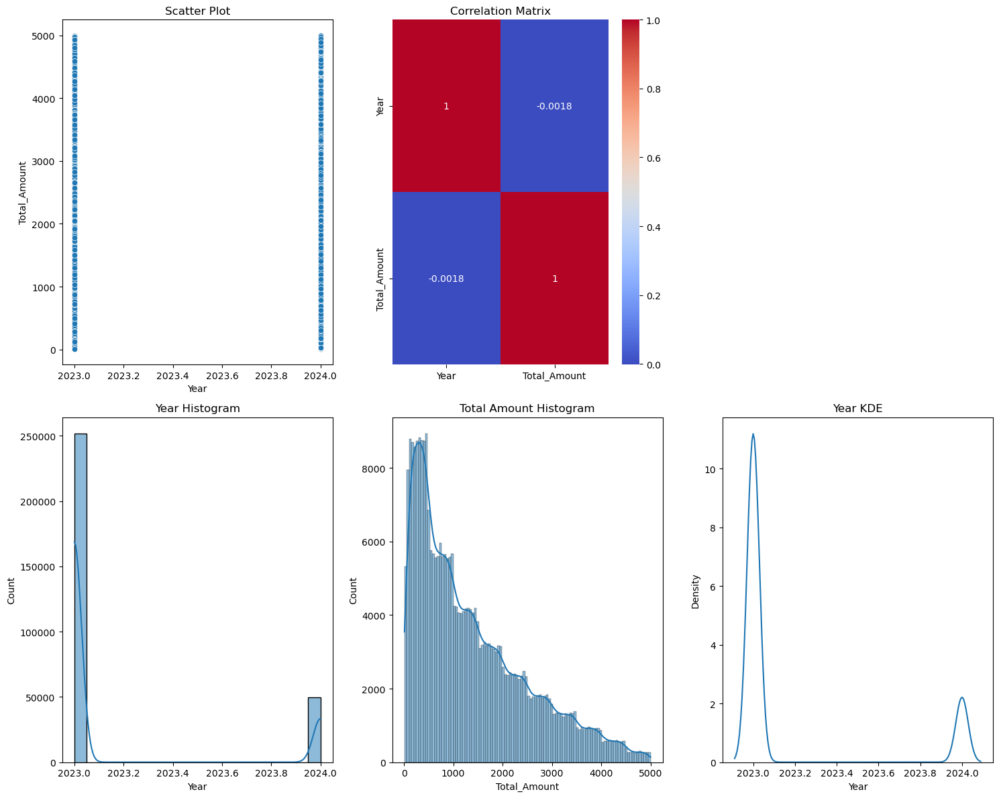

In [87]:
fig, axes = plt.subplots(2, 3, figsize=(15,12))

sns.scatterplot(x='Year', y='Total_Amount', data=df, ax=axes[0, 0])
axes[0,0].set_title('Scatter Plot')

corr = df[['Year', 'Total_Amount']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', ax=axes[0,1])
axes[0,1].set_title('Correlation Matrix')

sns.histplot(x='Year', data=df,kde=True, ax=axes[1, 0])
axes[1, 0].set_title('Year Histogram')

sns.histplot(x='Total_Amount', data=df,kde=True, ax=axes[1, 1])
axes[1, 1].set_title('Total Amount Histogram')

sns.kdeplot(x='Year', data=df, ax=axes[1, 2])
axes[1, 2].set_title('Year KDE')
fig.delaxes(axes[0, 2])
plt.tight_layout()
plt.show()

In [88]:
df[['State', 'Country']].describe()

,State,Country
count,301302,301302
unique,54,5
top,England,USA
freq,63196,95263


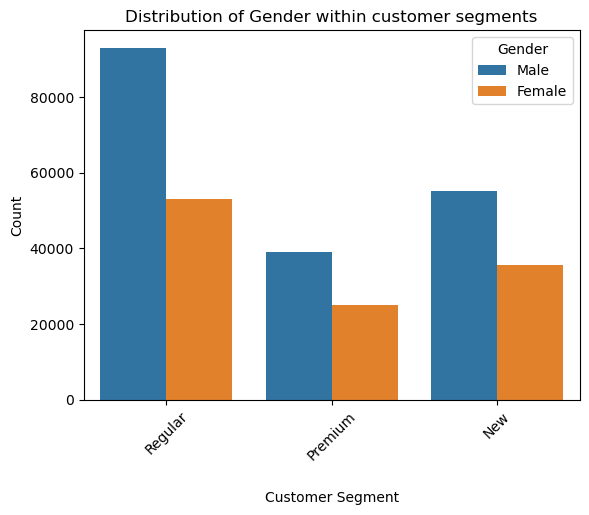

In [89]:
sns.countplot(data=df, x='Customer_Segment', hue='Gender')
plt.title('Distribution of Gender within customer segments')
plt.xlabel('Customer Segment', labelpad=20)
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Gender')
plt.show()

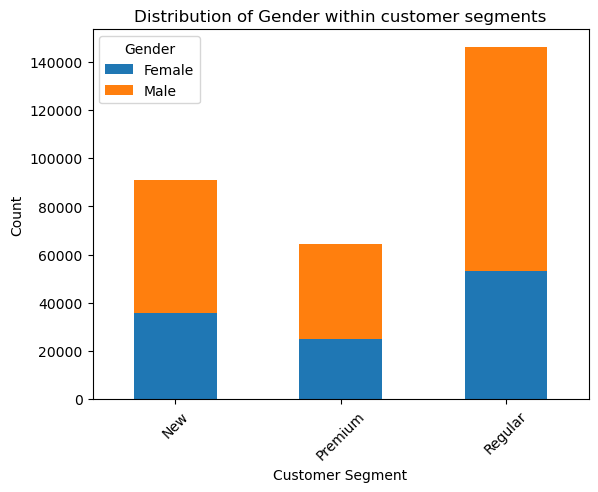

In [90]:
cross_table = pd.crosstab(df['Customer_Segment'], df['Gender'])

cross_table.plot(kind='bar', stacked=True)
plt.title('Distribution of Gender within customer segments')
plt.xlabel('Customer Segment')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Gender')
plt.show()

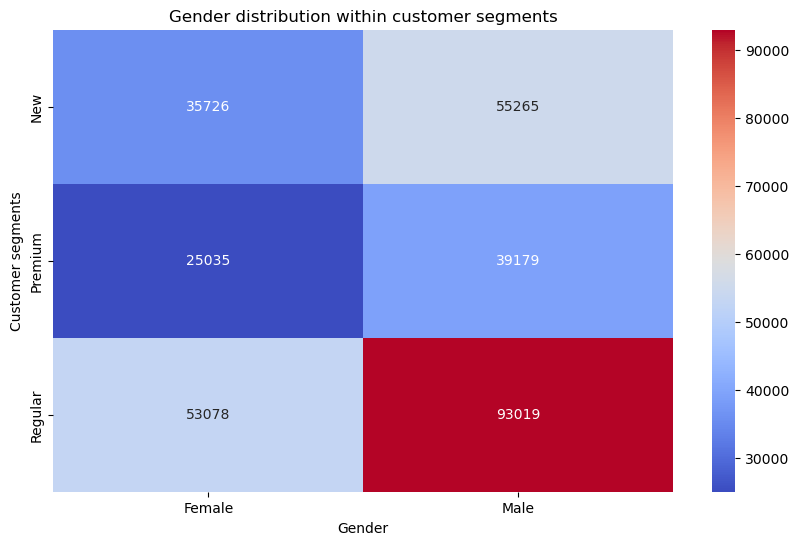

In [91]:
pivot_table = df.pivot_table(index='Customer_Segment', columns='Gender', aggfunc='size')

plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', fmt='d')
plt.title('Gender distribution within customer segments')
plt.xlabel('Gender')
plt.ylabel('Customer segments')
plt.show()

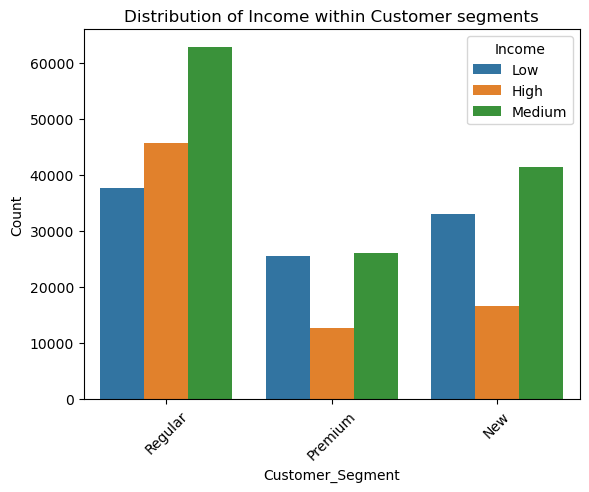

In [92]:
sns.countplot(data=df, x='Customer_Segment', hue='Income')
plt.title('Distribution of Income within Customer segments')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Income')
plt.show()

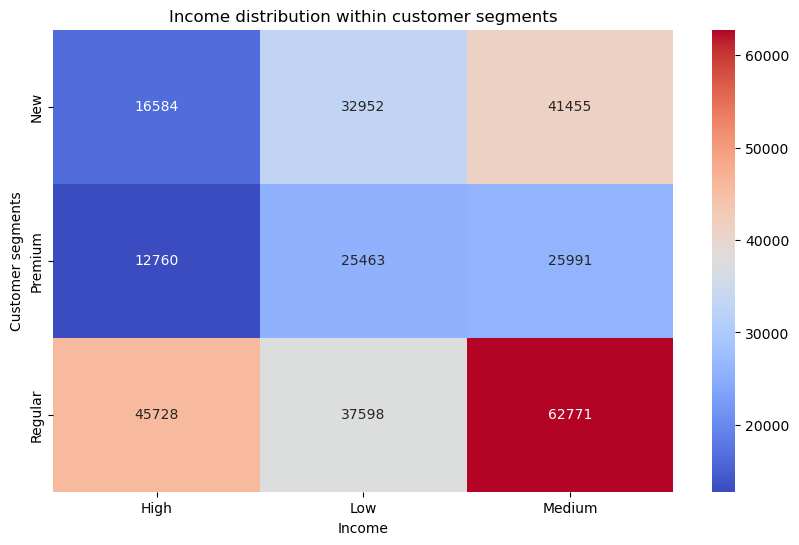

In [93]:
pivot_table = df.pivot_table(index='Customer_Segment', columns='Income', aggfunc='size')

plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', fmt='d')
plt.title('Income distribution within customer segments')
plt.xlabel('Income')
plt.ylabel('Customer segments')
plt.show()

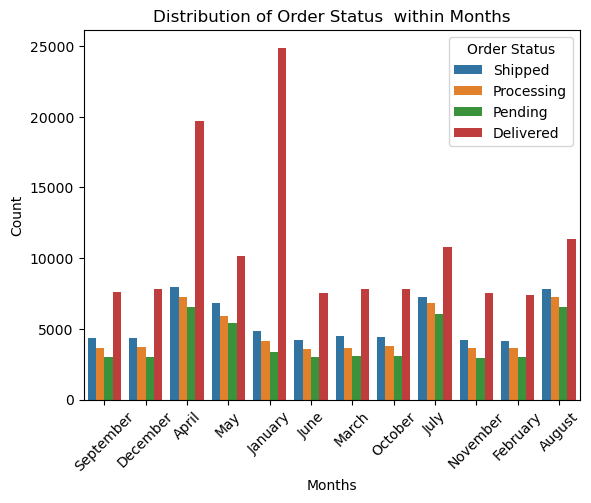

In [94]:
sns.countplot(data=df, x='Month', hue='Order_Status')
plt.title('Distribution of Order Status  within Months')
plt.xlabel('Months')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Order Status')
plt.show()

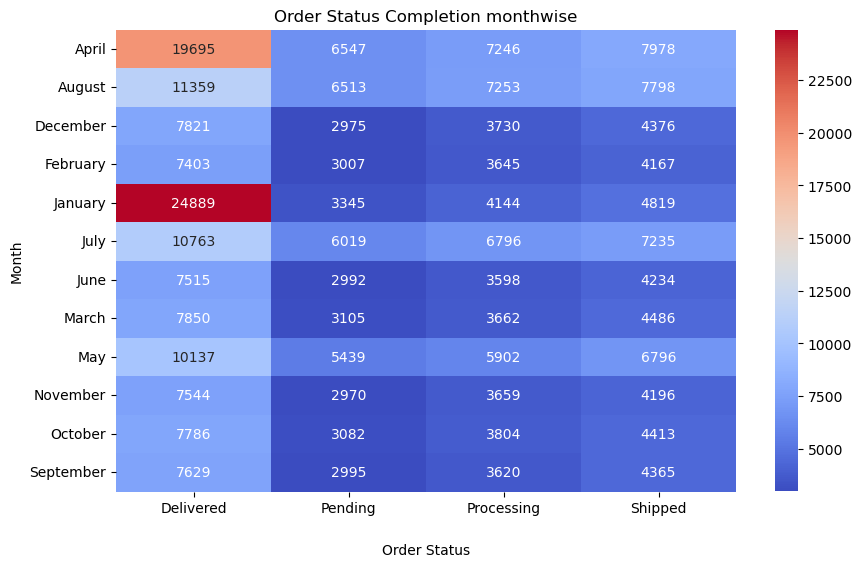

In [95]:
pivot_table = df.pivot_table(index='Month', columns='Order_Status', aggfunc='size')

plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', fmt='d')
plt.title('Order Status Completion monthwise')
plt.xlabel('Order Status', labelpad=20)
plt.ylabel('Month')
plt.show()

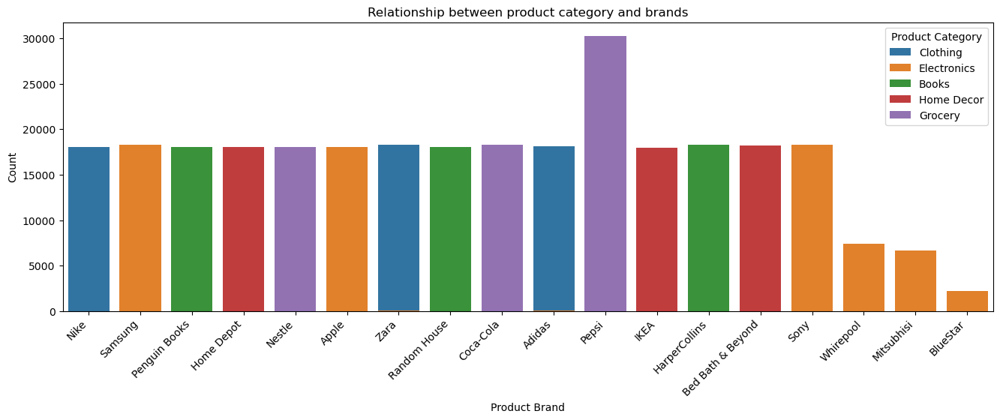

In [96]:
plt.figure(figsize=(16, 5))
sns.countplot(data=df, x='Product_Brand', hue='Product_Category', dodge=False)
plt.title('Relationship between product category and brands')
plt.xlabel('Product Brand')
plt.ylabel('Count')
plt.xticks(rotation=45)

ax = plt.gca()
labels = ax.get_xticklabels()
ax.set_xticklabels(labels, rotation=45, ha='right')
plt.legend(title='Product Category')


plt.show()

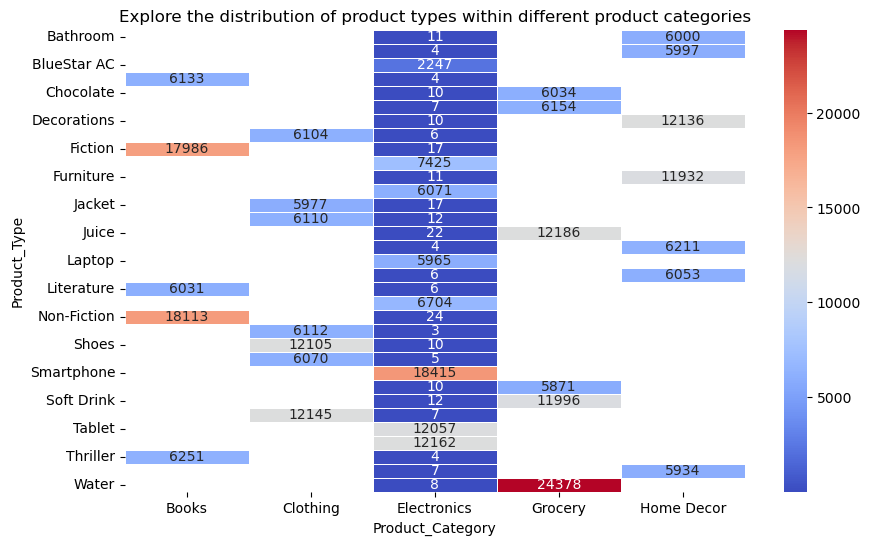

In [97]:
pivot_table = df.pivot_table(index='Product_Type', columns='Product_Category', aggfunc='size')

plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', fmt='.0f', linewidths=0.5)
plt.title('Explore the distribution of product types within different product categories')
plt.xlabel('Product_Category')
plt.ylabel('Product_Type')
plt.show()

Feedback and order status analyze how feedback relates to the order status

shipping methods and payment method explore the distribution of shipping and payment methods used

payment method and order status examine how payments methods are associated with different order statuses

Feedback and order status analysze how feedback realtes to the order status

In [98]:
df['Feedback'].describe()

count        301302
unique            4
top       Excellent
freq         100710
Name: Feedback, dtype: object

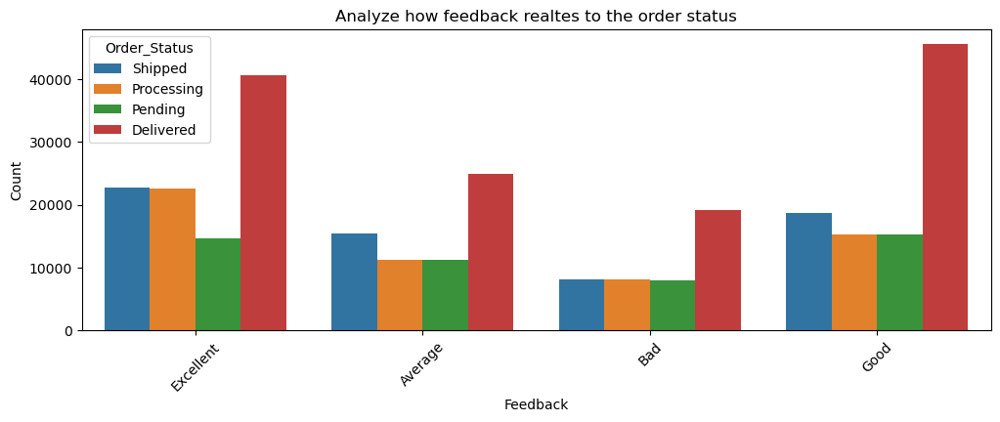

In [99]:
plt.figure(figsize=(12,4))
sns.countplot(data=df, x='Feedback', hue='Order_Status')
plt.title('Analyze how feedback realtes to the order status')
plt.xlabel('Feedback')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Order_Status')
plt.show()

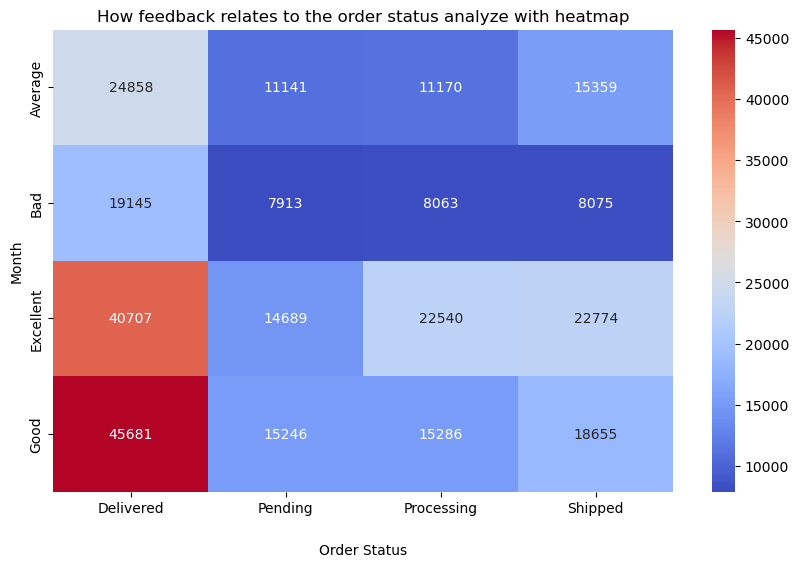

In [100]:
pivot_table = df.pivot_table(index='Feedback', columns='Order_Status', aggfunc='size')

plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', fmt='d')
plt.title('How feedback relates to the order status analyze with heatmap')
plt.xlabel('Order Status', labelpad=20)
plt.ylabel('Month')
plt.show()

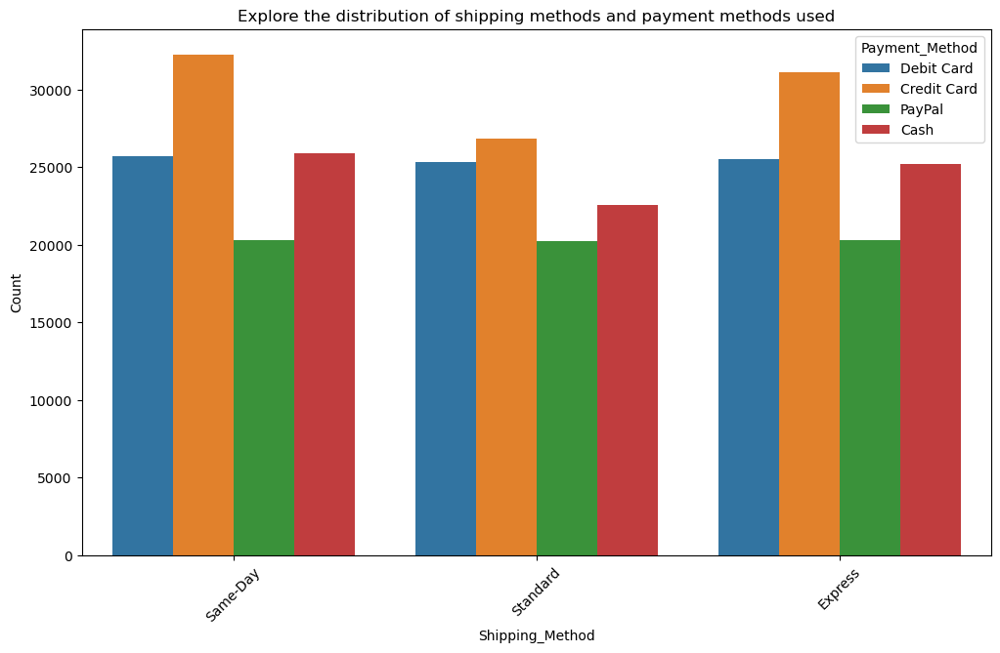

In [101]:

# Create a count plot
plt.figure(figsize=(12,7))
sns.countplot(data=df, x='Shipping_Method', hue='Payment_Method')
plt.title('Explore the distribution of shipping methods and payment methods used')
plt.xlabel('Shipping_Method')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Payment_Method')
plt.show()

Shipping method and payment method explore the distribution of shipping methods and payment methods used

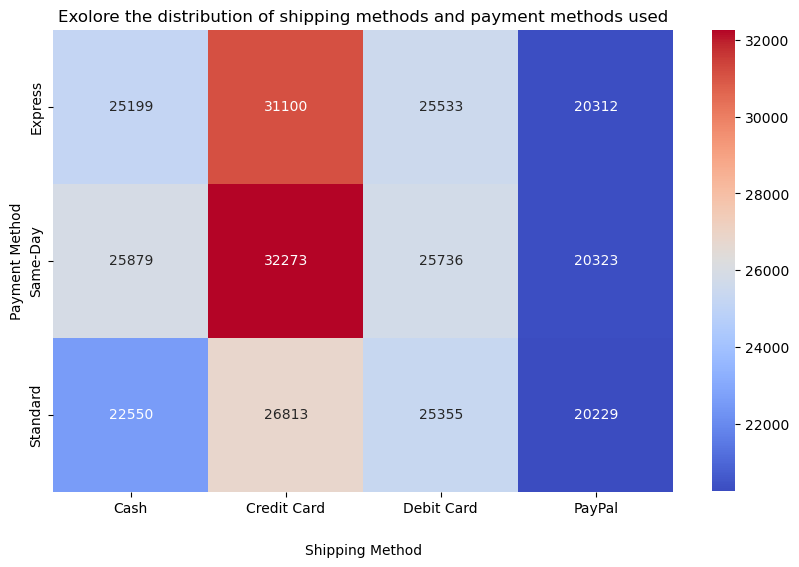

In [102]:
# create a pivot table to aggregate counts
pivot_table = df.pivot_table(index='Shipping_Method', columns='Payment_Method', aggfunc='size')

plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', fmt='.0f')
plt.title('Exolore the distribution of shipping methods and payment methods used')
plt.xlabel('Shipping Method', labelpad=20)
plt.ylabel('Payment Method')
plt.show()

payment mehod and order status examine how paymentss methods are associated with different order status

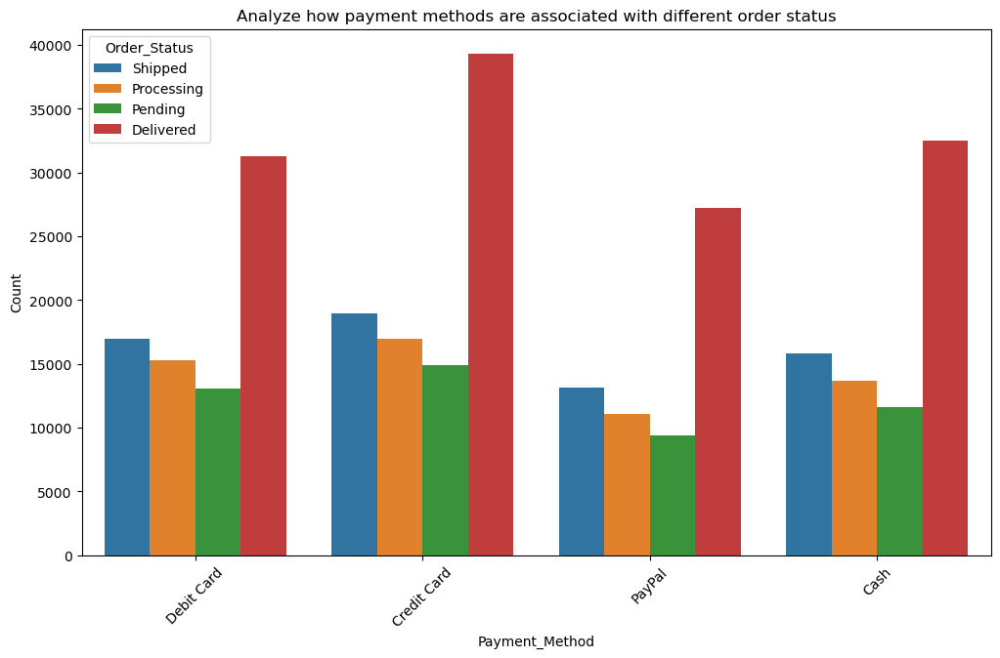

In [103]:

# Create a count plot
plt.figure(figsize=(12,7))
sns.countplot(data=df, x='Payment_Method', hue='Order_Status')
plt.title('Analyze how payment methods are associated with different order status')
plt.xlabel('Payment_Method')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Order_Status')
plt.show()

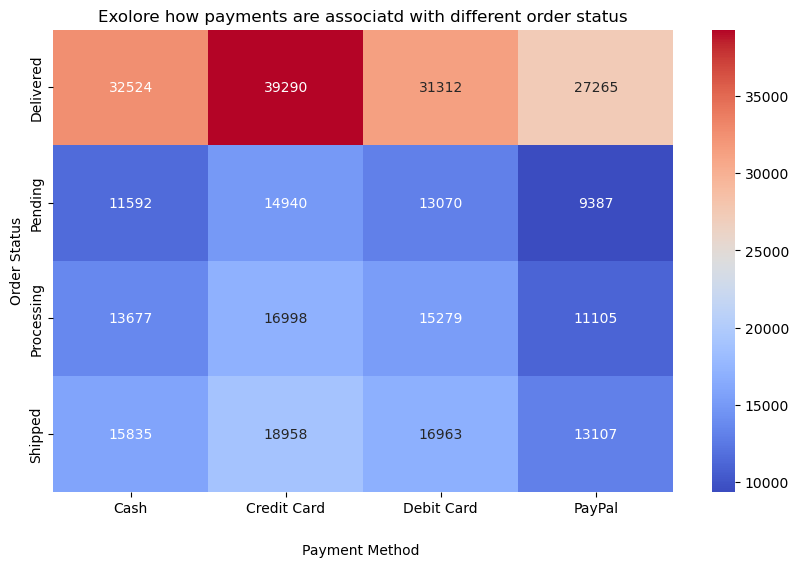

In [104]:
# create a pivot table to aggregate counts
pivot_table = df.pivot_table(index='Order_Status', columns='Payment_Method', aggfunc='size')

plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', fmt='.0f')
plt.title('Exolore how payments are associatd with different order status')
plt.xlabel('Payment Method ', labelpad=20)
plt.ylabel('Order Status')
plt.show()

Numerical and Categorical bivariate analysis

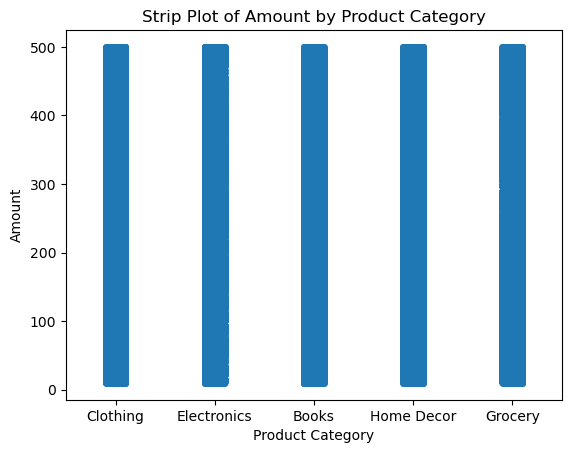

In [105]:
sns.stripplot(x='Product_Category', y='Amount', data=df, jitter=True)
plt.title('Strip Plot of Amount by Product Category')
plt.xlabel('Product Category')
plt.ylabel('Amount')
plt.show()

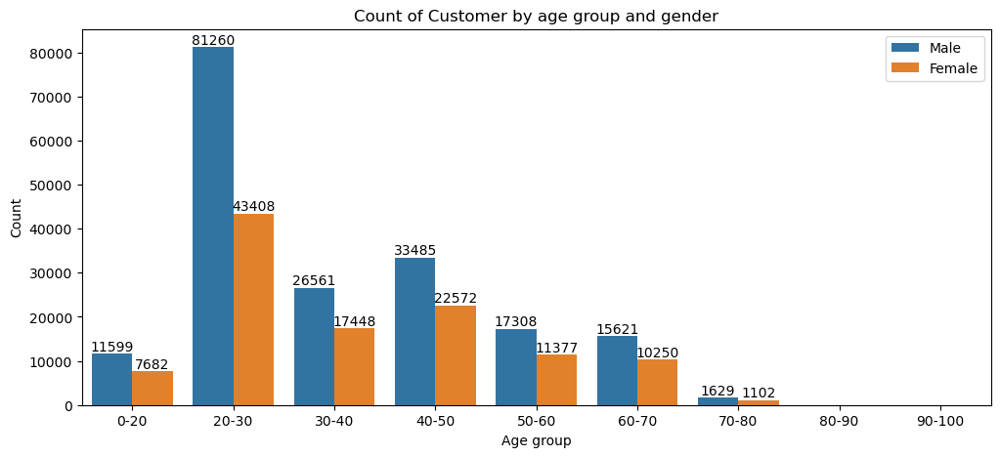

In [106]:
age_bins = [0, 20, 30, 40 , 50, 60, 70, 80, 90, 100]
age_labels = ['0-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80', '80-90',  '90-100']
df['Age_Group'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=False)

plt.figure(figsize=(12,5))
age_grp = sns.countplot(data=df, x='Age_Group', hue='Gender', alpha=1)

for bar in age_grp.containers:
    age_grp.bar_label(bar)

age_grp.set_title('Count of Customer by age group and gender')
age_grp.set_xlabel('Age group')
age_grp.set_ylabel('Count')
age_grp.legend(loc='upper right')
plt.show()


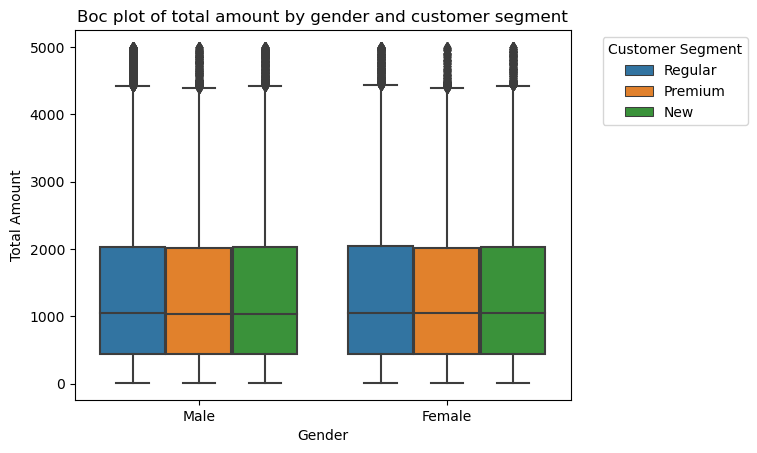

In [107]:
# create box plot
sns.boxplot(data=df, x='Gender', y='Total_Amount',  hue='Customer_Segment')

plt.title('Boc plot of total amount by gender and customer segment')
plt.xlabel('Gender')
plt.ylabel('Total Amount')
plt.legend(title='Customer Segment')
plt.legend(title='Customer Segment', bbox_to_anchor=(1.05, 1), loc='upper left') # Move the legend outside the graph
plt.show()

C:\Users\mahes\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



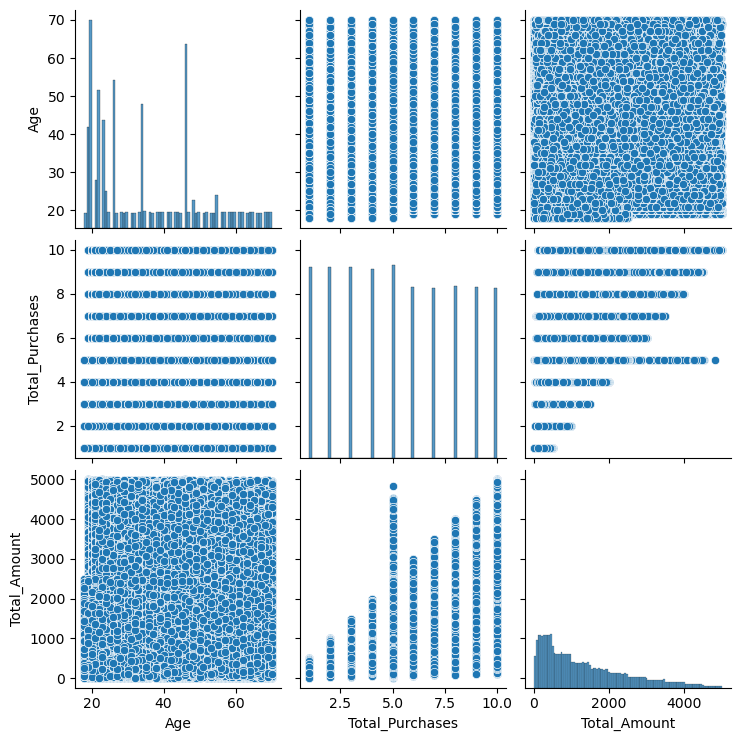

In [108]:
sns.pairplot(df[['Age', 'Total_Purchases', 'Total_Amount']])
plt.show()

use cases EDA Exploratory Data Analysis

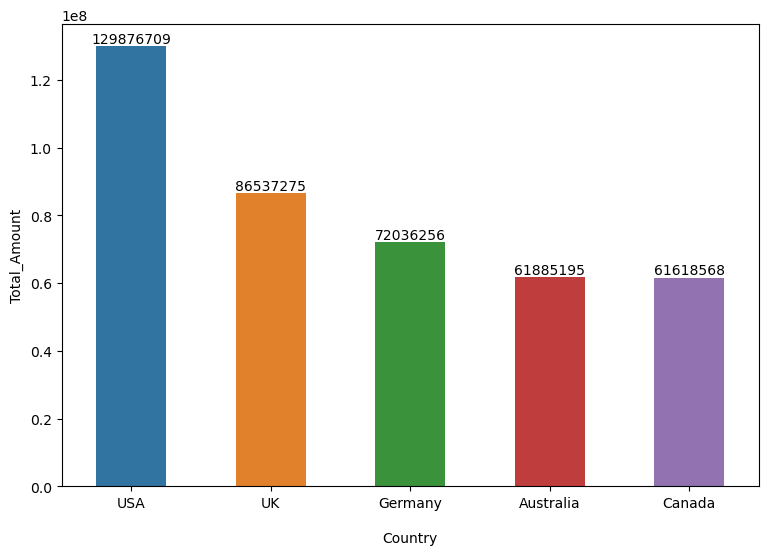

In [109]:
plt.figure(figsize=(9,6))
sales_loc = df.groupby(['Country'], as_index=False)['Total_Amount'].sum().sort_values(by='Total_Amount', ascending=False)

sns.barplot(data=sales_loc, x='Country', y='Total_Amount', width=.5)
ax=plt.gca()

for container in ax.containers:
    ax.bar_label(container, fmt='%.0f', label_type='edge')

plt.xlabel('Country', labelpad=15)
plt.show()

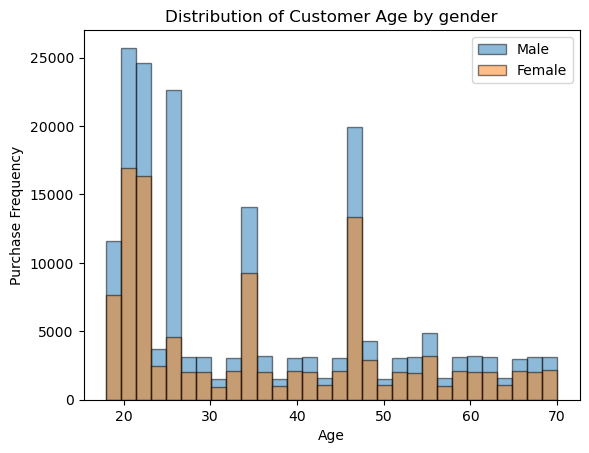

In [110]:
male_age = df[df['Gender'] == 'Male']['Age']
female_age = df[df['Gender'] == 'Female']['Age']

plt.hist(male_age, bins=30, edgecolor='black', alpha=0.5, label='Male')
plt.hist(female_age, bins=30, edgecolor='black', alpha=0.5, label='Female')

plt.title('Distribution of Customer Age by gender')
plt.xlabel('Age')
plt.ylabel('Purchase Frequency')
plt.legend()
plt.show()

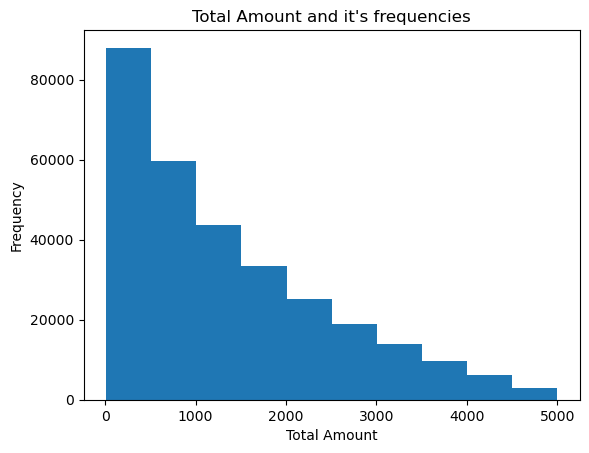

In [111]:
df['Total_Amount'].plot(kind='hist')
plt.xlabel('Total Amount')
plt.title("Total Amount and it's frequencies")
plt.show()

<Axes: xlabel='Order_Status', ylabel='count'>

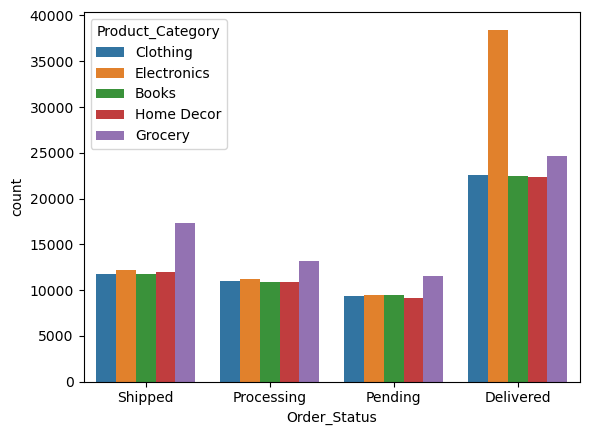

In [112]:
sns.countplot(data=df, x='Order_Status', hue='Product_Category')

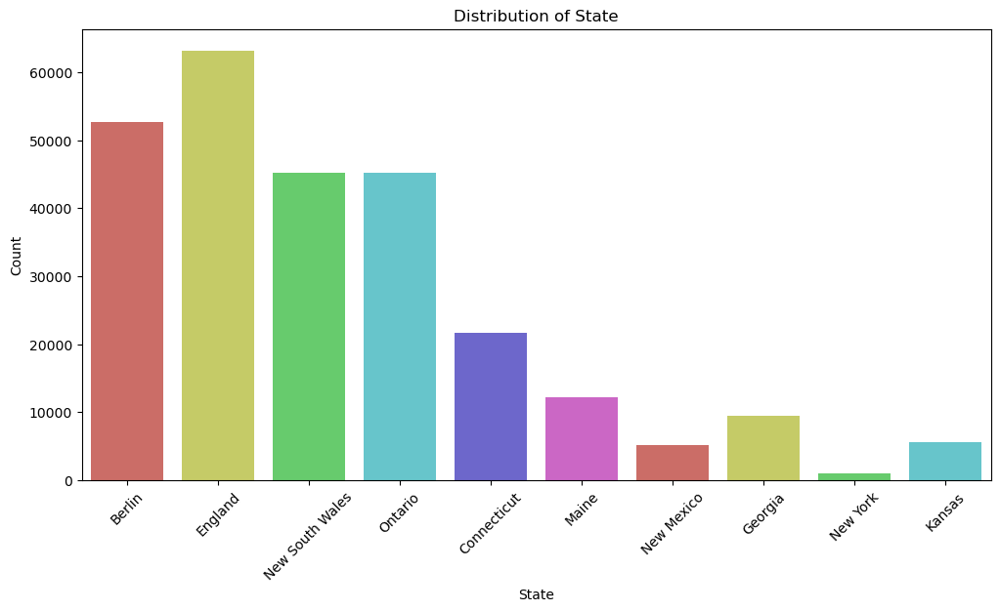

In [113]:
top_10_state = df['State'].value_counts().head(10)

plt.figure(figsize=(12,6))
sns.countplot(data=df[df['State'].isin(top_10_state.index)], x='State', dodge=False, palette= sns.color_palette('hls'))
plt.xlabel('State')
plt.ylabel('Count')
plt.title('Distribution of State')
plt.xticks(rotation=45)
plt.show()

Checking age group between 20 to 30 which type product purchase

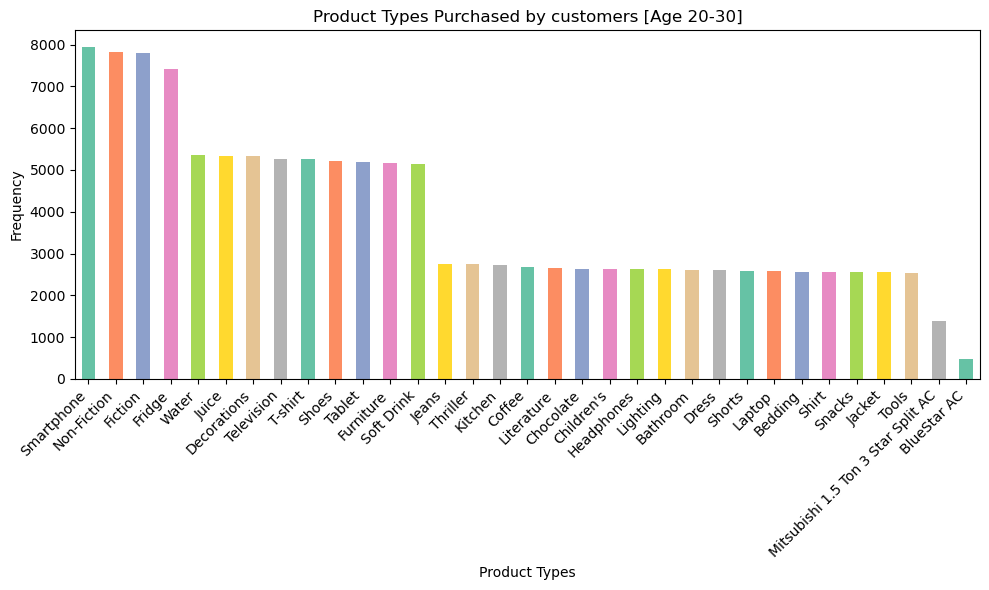

In [114]:
age_group_df = df[(df['Age'] >= 20) & (df['Age'] <= 30)]

product_type_counts = age_group_df['Product_Type'].value_counts()

plt.figure(figsize=(10, 6))
product_type_counts.plot(kind='bar', color=sns.color_palette('Set2'))
plt.xlabel('Product Types')
plt.ylabel('Frequency')
plt.title('Product Types Purchased by customers [Age 20-30]')
plt.xticks(rotation=45)

ax = plt.gca()
labels = ax.get_xticklabels()
ax.set_xticklabels(labels, rotation=45, ha='right')

plt.tight_layout()
plt.show()

Which Age group give bad feedback based on which state with product name


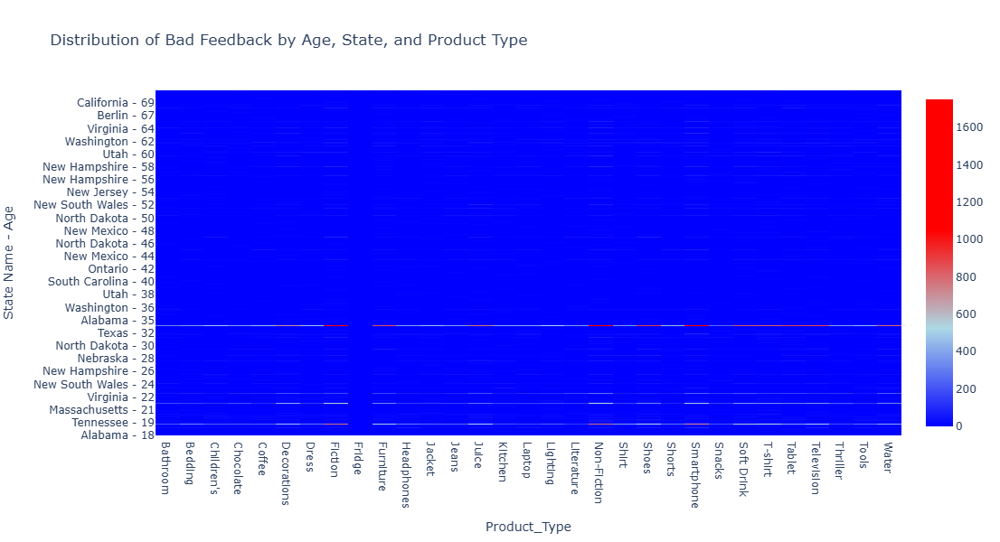

In [115]:
bad_feedback_df = df[df['Feedback'] == 'Bad']

age_state_product_count =  bad_feedback_df.groupby(['Age', 'State', 'Product_Type']).size().reset_index(name='Count')


pivot_table = age_state_product_count.pivot_table(index=['Age', 'State'], columns='Product_Type', values='Count', aggfunc='sum', fill_value=0)

product_type_map = dict(zip(age_state_product_count['Product_Type'], age_state_product_count['Product_Type']))

formatted_product_names = [f'<br>'.join(product_type_map[product_type_code].split()) for product_type_code in pivot_table.columns]

state_map = dict(zip(bad_feedback_df['State'], bad_feedback_df['State']))

z_values = pivot_table.values * 10

colorscale = [
    [0, 'blue'],
    [0.3, 'lightblue'],
    [0.6, 'red'],
    [1, 'red']
]


fig = go.Figure(data=go.Heatmap(
    z=z_values,
    x=pivot_table.columns,
    y=pivot_table.index.get_level_values('State') + ' - '+ pivot_table.index.get_level_values('Age').astype(str),
    colorscale=colorscale,
    hoverongaps=True,
    hovertemplate='Product Type: %{x}<br>' +
                    'State Name - Age: %{y}<br>' +
                    'Count: %{z}<extra></extra>',
    text=pivot_table.index.get_level_values('Age'),
    textfont=dict(size=14)
))

fig.update_layout(
    title='Distribution of Bad Feedback by Age, State, and Product Type',
    xaxis_title ='Product_Type',
    yaxis_title='State Name - Age',
    width=1000,
    height=600,
    coloraxis_colorbar=dict(
        thickness=25,
        len=0.75,
        dtick=100,
    )
)

fig.show()

Which Country purchase more product which type prdouct analyse it

C:\Users\mahes\AppData\Local\Temp\ipykernel_8248\247464591.py:29: UserWarning:

FixedFormatter should only be used together with FixedLocator



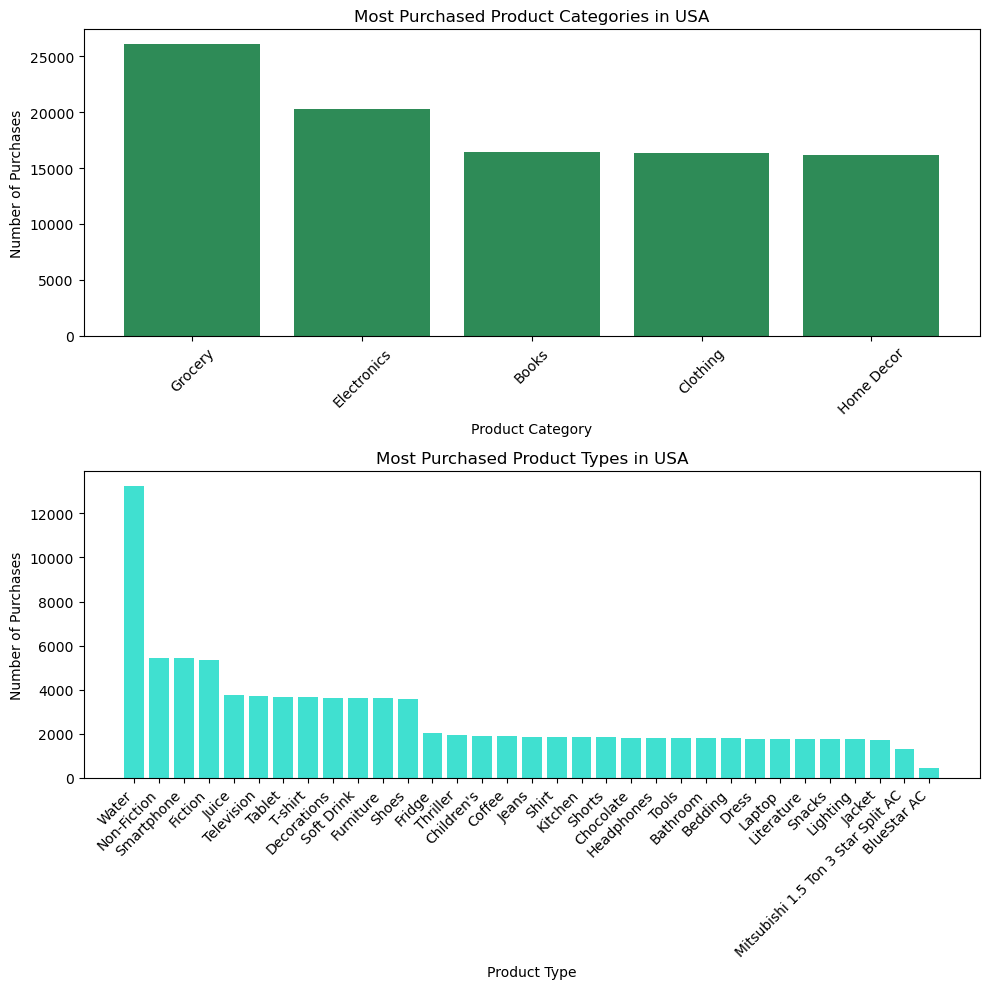

In [116]:
country_purchase_count = df['Country'].value_counts()


top_country = country_purchase_count.idxmax()

top_country_df = df[df['Country'] == top_country]

category_counts = top_country_df['Product_Category'].value_counts()

type_counts = top_country_df['Product_Type'].value_counts()

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10))

ax1.bar(category_counts.index, category_counts.values, color='seagreen')
ax1.set_title('Most Purchased Product Categories in {}' .format(top_country))
ax1.set_xlabel('Product Category')
ax1.set_ylabel('Number of Purchases')
ax1.tick_params(axis='x', rotation=45)

ax2.bar(type_counts.index, type_counts.values, color='turquoise')
ax2.set_title('Most Purchased Product Types in {}' .format(top_country))
ax2.set_xlabel('Product Type')
ax2.set_ylabel('Number of Purchases')
ax2.tick_params(axis='x', rotation=45)


ax = plt.gca()
labels = ax.get_xticklabels()
ax.set_xticklabels(labels, rotation=45, ha='right')

plt.tight_layout()
plt.show()

<Figure size 1200x800 with 0 Axes>

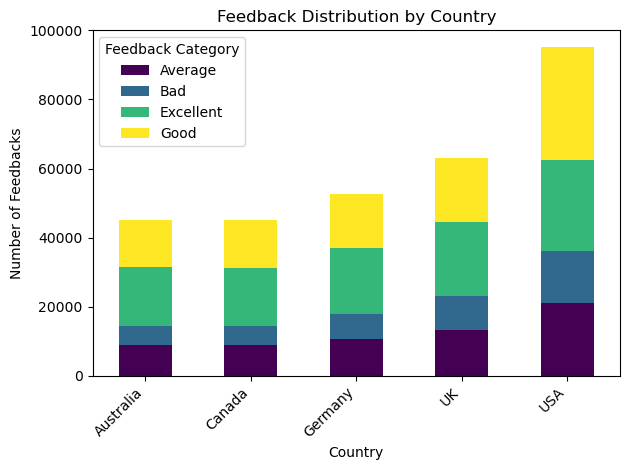

In [117]:
feedback_categories = ['Bad', 'Good', 'Excellent', 'Average']
feedback_df = df[df['Feedback'].isin(feedback_categories)]

country_feedback_counts = feedback_df.groupby(['Country', 'Feedback']).size().unstack(fill_value=0)

plt.figure(figsize=(12, 8))
country_feedback_counts.plot(kind='bar', stacked=True, cmap='viridis')
plt.title('Feedback Distribution by Country')
plt.xlabel('Country')
plt.ylabel('Number of Feedbacks')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Feedback Category')
plt.tight_layout()
plt.show()

To show which type of product received feedback from each country

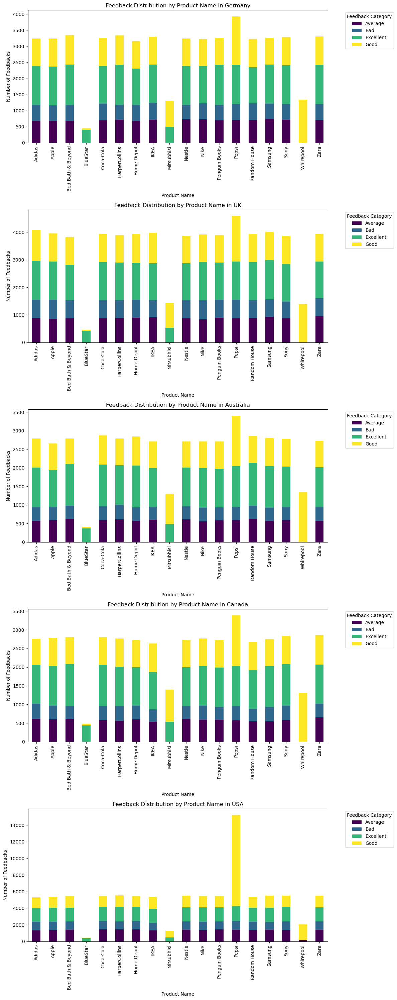

In [118]:
feedback_categories = ['Bad', 'Good', 'Excellent', 'Average']
feedback_df = df[df['Feedback'].isin(feedback_categories)]


country_product_name_feedback_counts = feedback_df.groupby(['Country', 'Product_Brand', 'Feedback']).size().unstack(fill_value=0)

countries = df['Country'].unique()

fig, axes =plt.subplots(len(countries), figsize=(12, 6 * len(countries)))

for i, country in enumerate(countries):
    
    country_product_name_feedback_counts_counrty = country_product_name_feedback_counts.loc[country] 

    country_product_name_feedback_counts_counrty.plot(kind='bar', stacked=True, ax=axes[i], cmap='viridis')
    axes[i].set_title('Feedback Distribution by Product Name in {}' .format(country))
    axes[i].set_xlabel('Product Name')
    axes[i].set_ylabel('Number of Feedbacks')
    axes[i].legend(title='Feedback Category', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

Which country and thier state which product brand more sale an generate more profite

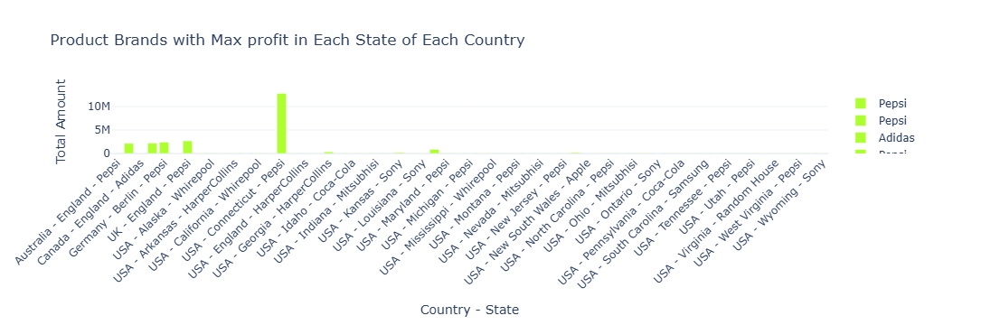

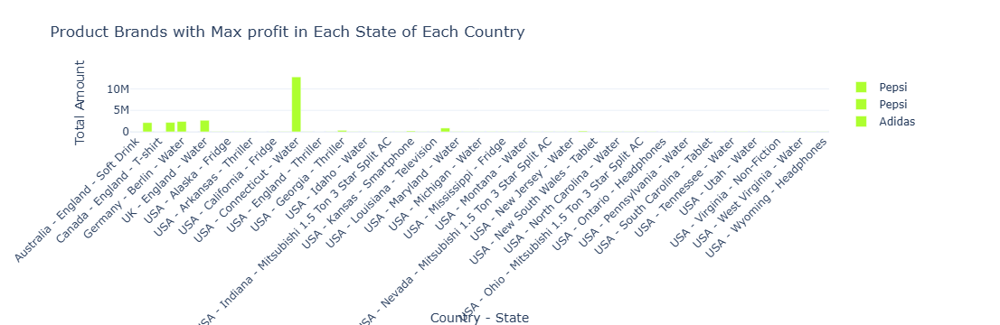

In [119]:
country_state_brand_sales_profit = df.groupby(['Country', 'State','Product_Brand', 'Product_Type'])[['Total_Purchases', 'Total_Amount']].sum()

max_sales_indices = country_state_brand_sales_profit.groupby(['Country', 'State'])['Total_Purchases'].idxmax()

max_profit_indices = country_state_brand_sales_profit.groupby(['Country', 'State'])['Total_Amount'].idxmax()

max_sales_brands = country_state_brand_sales_profit.loc[max_sales_indices]
max_profit_brands = country_state_brand_sales_profit.loc[max_sales_indices]

fig = go.Figure()
for index, row in max_sales_brands.reset_index().iterrows():
    fig.add_trace(go.Bar (x=[f"{row['Country']} - {row['State']} - {row['Product_Brand']}"], y=[row['Total_Amount']], 
                          name=row['Product_Brand'], marker_color='greenyellow'))
    
fig.update_layout(title='Product Brands with Max profit in Each State of Each Country', 
                 xaxis_title='Country - State', yaxis_title='Total Amount', xaxis_tickangle=-45)
fig.show()


fig = go.Figure()
for index, row in max_sales_brands.reset_index().iterrows():
    fig.add_trace(go.Bar (x=[f"{row['Country']} - {row['State']} - {row['Product_Type']}"], y=[row['Total_Amount']], 
                          name=row['Product_Brand'], marker_color='greenyellow'))
    
fig.update_layout(title='Product Brands with Max profit in Each State of Each Country', 
                 xaxis_title='Country - State', yaxis_title='Total Amount', xaxis_tickangle=-45)
fig.show()

Total amount generated per month for each product category and country

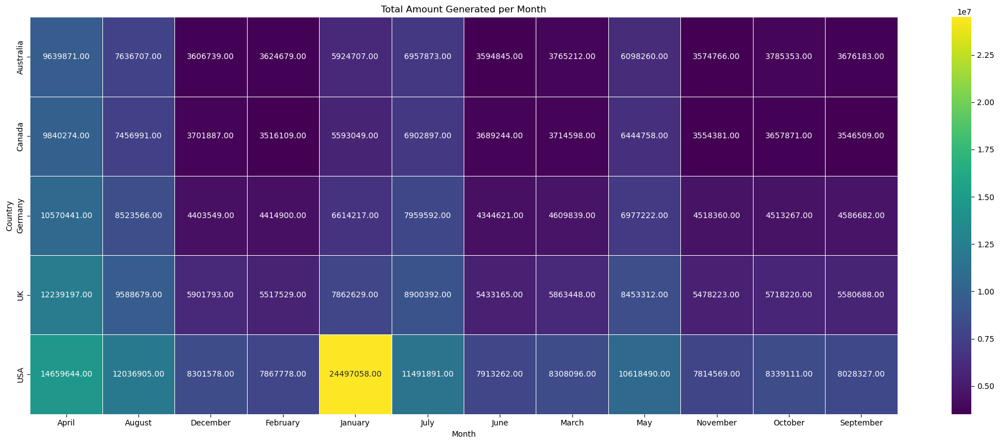

In [120]:
country_month_category_amount = df.groupby(['Country', 'Month'])['Total_Amount'].sum().reset_index()

pivot_table = country_month_category_amount.pivot_table(index='Country', columns='Month', values='Total_Amount', aggfunc='sum')

plt.figure(figsize=(20, 8))
sns.heatmap(pivot_table, cmap='viridis', annot=True, fmt='.2f', linewidths=0.5)
plt.title('Total Amount Generated per Month')
plt.xlabel('Month')
plt.ylabel('Country')
plt.tight_layout()
plt.show()

From which country retailers generate more profit their pie chart

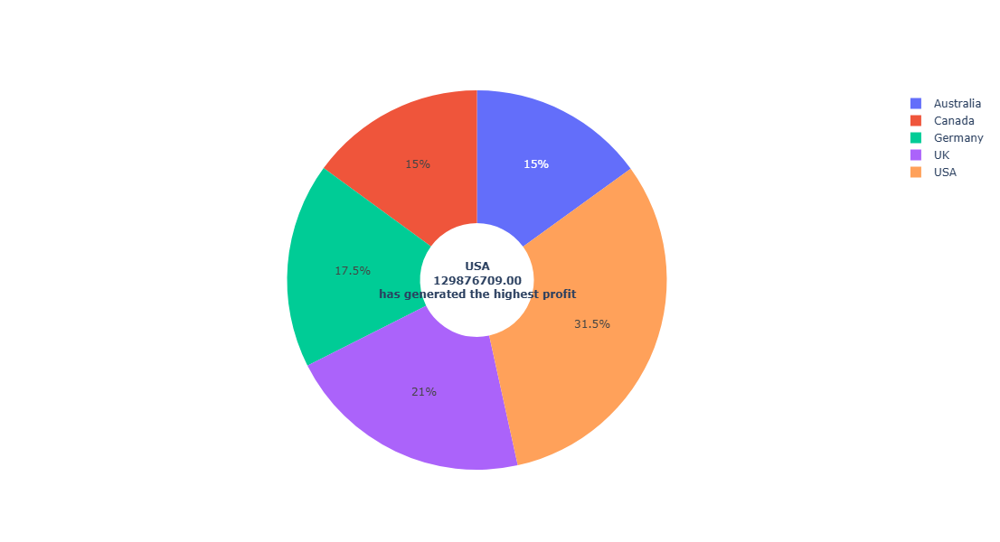

In [121]:
country_profit = df.groupby('Country')['Total_Amount'].sum().reset_index()

top_country = country_profit.loc[country_profit['Total_Amount'].idxmax()]

labels = country_profit['Country'].tolist()
values = country_profit['Total_Amount'].tolist()


fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3, sort=False)])

center_text = f"<b>{top_country['Country']}</br>{top_country['Total_Amount']:.2f}<br>has generated the highest profit"

fig.update_layout(annotations=[dict(text=center_text, showarrow=False)], width=1680, height=600)

fig.update_traces(hoverinfo='label+percent')

fig.show()

Sales trend analysis over time for understand seasonal trends

In [122]:
df['Date'] = pd.to_datetime(df['Date'])
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year

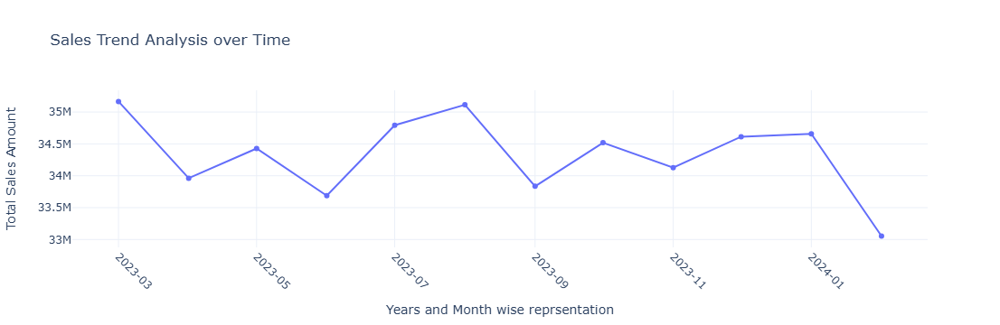

In [123]:
sales_trend = df.groupby(['Year', 'Month'])['Total_Amount'].sum().reset_index()
sales_trend['Date'] = sales_trend['Year'].astype(str) + '-' + sales_trend['Month'].astype(str).str.zfill(2)
fig = px.line(sales_trend, x='Date', y='Total_Amount', markers=True,
              labels={'Total Amount': 'Total Sales Amount', 'Date': 'Years and Month wise reprsentation'},
              title='Sales Trend Analysis over Time')

fig.update_layout(xaxis_tickangle=45, xaxis=dict(tickformat='%Y-%m'), yaxis_title='Total Sales Amount')
fig.show()

Product trends on category wise

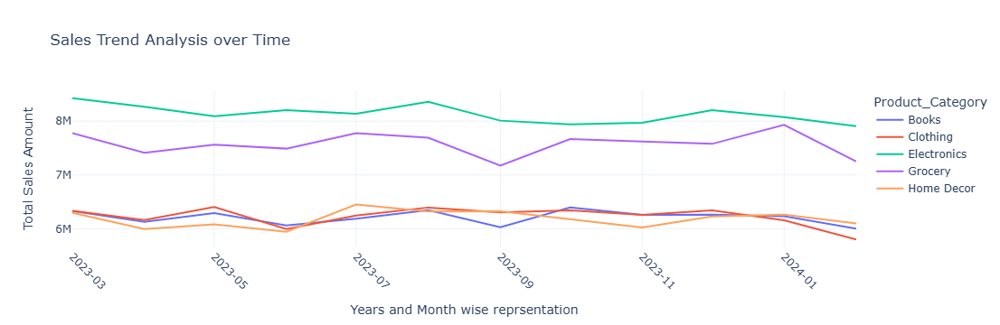

In [124]:
sales_trend = df.groupby(['Product_Category', 'Year', 'Month'])['Total_Amount'].sum().reset_index()
sales_trend['Date'] = sales_trend['Year'].astype(str) + '-'+ sales_trend['Month'].astype(str).str.zfill(2)

fig = px.line(sales_trend, x='Date', y='Total_Amount', color='Product_Category',
            labels={'Total Amount': 'Total Sales Amount', 'Date': 'Years and Month wise reprsentation'},
              title='Sales Trend Analysis over Time')

fig.update_layout(xaxis_tickangle=45, xaxis=dict(tickformat='%Y-%m'), yaxis_title='Total Sales Amount')
fig.show()

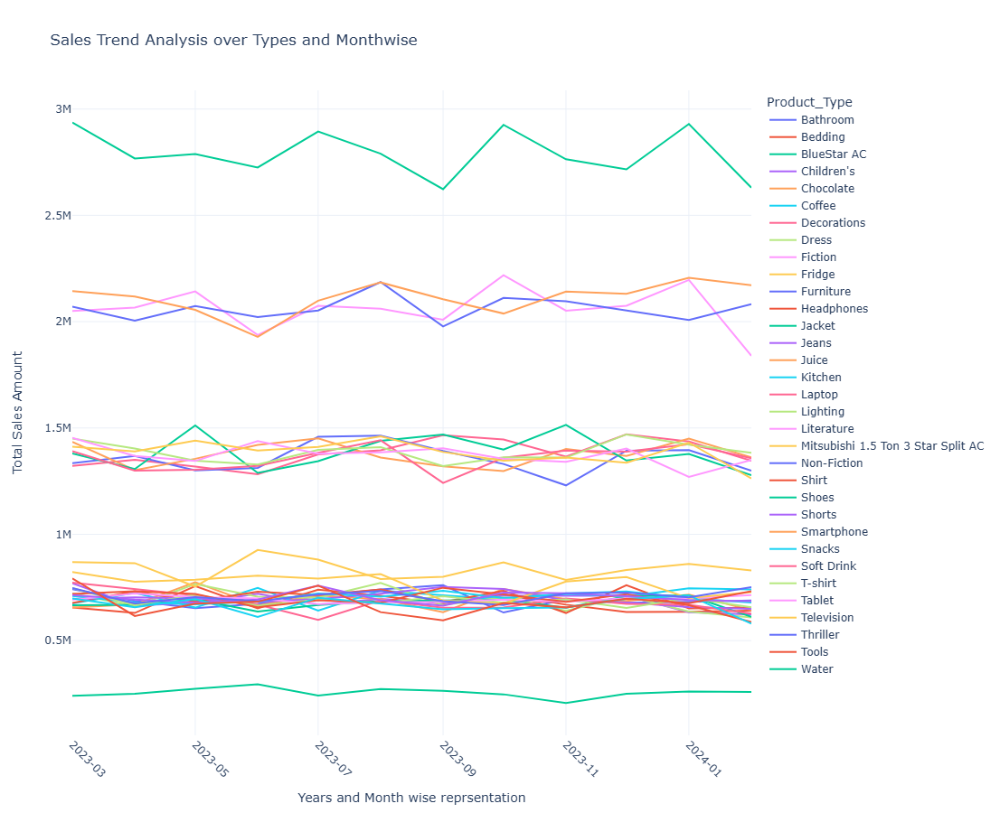

In [125]:
sales_trend = df.groupby(['Product_Type', 'Year', 'Month'])['Total_Amount'].sum().reset_index()

sales_trend['Date'] = sales_trend['Year'].astype(str) + '-'+ sales_trend['Month'].astype(str).str.zfill(2)

fig = px.line(sales_trend, x='Date', y='Total_Amount', color='Product_Type',
            labels={'Total Amount': 'Total Sales Amount', 'Date': 'Years and Month wise reprsentation'},
              title='Sales Trend Analysis over Types and Monthwise', width=1200, height=900)

fig.update_layout(xaxis_tickangle=45, xaxis=dict(tickformat='%Y-%m'), yaxis_title='Total Sales Amount')
fig.show()

In [126]:
month_names = {
    1: 'January', 2: 'February', 3:'March', 4:'April', 5: 'May', 6:'June', 7: 'July', 8: 'August', 9: 'September', 10: 'October', 11:'November', 12: 'December'}

df['Month'] = df['Date'].dt.month.map(month_names).astype('category')

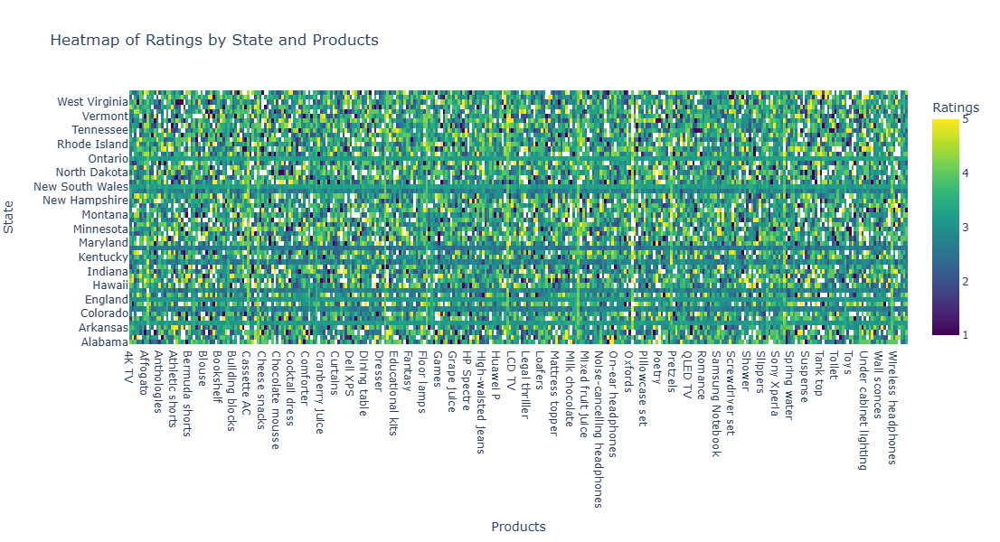

In [127]:
pivot_table = pd.pivot_table(df, values='Ratings', index=['State'], columns='products', aggfunc='mean')

fig = go.Figure(data=go.Heatmap(
    z=pivot_table.values,
    x=pivot_table.columns,
    y=pivot_table.index,
    colorscale='Viridis',
    colorbar=dict(title='Ratings')

))

fig.update_layout(
    title='Heatmap of Ratings by State and Products',
    xaxis=dict(title='Products'),
    yaxis=dict(title='State'),
    height=600

)

fig.show()